In [1]:
# from __future__ import print_function
from __future__ import division

import json
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import gzip
from scipy.misc import imsave
import time
import scipy.ndimage

from keras import backend as K
from keras.layers import Input, merge, Convolution2D, MaxPooling2D, UpSampling2D, Dropout

from keras.layers import *
from keras.layers.merge import concatenate
from keras.models import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, Callback
from keras import losses

from keras.preprocessing.image import ImageDataGenerator

from scipy.ndimage import morphology
from numpy import linalg

import random
from itertools import islice
from scipy.ndimage.morphology import distance_transform_edt as edt


Using TensorFlow backend.


In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "3, 4"


In [3]:
cd ..

/home/malub_local/activelearningADS


## Utils

In [4]:
def preprocessor(input_img, img_rows, img_cols):
    """
    Resize input images to constants sizes
    :param input_img: numpy array of images
    :return: numpy array of preprocessed images
    """
    output_img = np.ndarray((input_img.shape[0], input_img.shape[1], img_rows, img_cols), dtype=np.uint8)
    
    for i in range(input_img.shape[0]):
        output_img[i, 0] = cv2.resize(input_img[i, 0], (img_cols, img_rows), interpolation=cv2.INTER_CUBIC)
    
    return output_img


def load_data(path_img, path_mask, img_rows, img_cols):
    """
    Load data from project path
    :return: [X, y] numpy arrays containing the [training, validation, test] data and their respective masks.
    """
    print("\nLoading data...\n")
    X = np.load(path_img)
    y = np.load(path_mask)

    X = preprocessor(X, img_rows, img_cols)
    y = preprocessor(y, img_rows, img_cols)

    X = X.astype('float32')

    mean = np.mean(X)  # mean for data centering
    std = np.std(X)  # std for data normalization

    X -= mean
    X /= std

    y = y.astype('float32')
    y /= 255.  # scale masks to [0, 1]
    return X, y



#### loss and metrics #####
def dice_coef(y_true, y_pred, smooth = 1.):
    """Compute Dice Coefficient between prediction and Ground Truth
    :param y_true: ground truth
    :param y_pred: prediction
    :param smooth: avoid division by 0
    :return: dice coefficient
    """
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_2(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef_2(y_true, y_pred)


def weighted_binary_crossentropy(y_true, y_pred):
    """Compute the weighted binary cross-entropy
    :param y_true: ground truth
    :param y_pred: prediction
    :return: weighted binary cross-entropy
    """
    b_ce = K.binary_crossentropy(y_true, y_pred)  # Calculate the binary crossentropy
    weight_vector = y_true * 0.30 + (1. - y_true) * 0.70  # Apply the weights
    weighted_b_ce = weight_vector * b_ce        
    return K.mean(weighted_b_ce) # Return the mean error


### data augmentation ######
def data_generator():
    """
    :return: Keras data generator. Data augmentation parameters.
    """
    return ImageDataGenerator(
        fill_mode = fill_mode,
        rotation_range = rotation_range,
        horizontal_flip = horizontal_flip,
        vertical_flip = vertical_flip,
        rescale = rescale,
        zoom_range = zoom_range,
        channel_shift_range = channel_shift_range,
        width_shift_range = width_shift_range,
        height_shift_range = height_shift_range)
        #preprocessing_function = random_gaussian_noise)

def random_gaussian_noise(image):
    """Randomly apply gaussian noise to input image for data augmentation
    :param image: input image
    :return: noisy image
    """
    apply_gaussian_noise = random.choice([True, False])
    if apply_gaussian_noise == True:
        output_image = noisy(image)
    else:
        output_image = image
    return output_image
    

def noisy(image):
    """Apply gaussian noise to input image for data augmentation
    :param image: input image
    :return: noisy image
    """
    ch, row, col = image.shape
    mean = 0
    sigma = np.random.uniform(low=0.0, high=sigma_max, size=None)
    gauss = np.random.normal(mean, sigma, (ch, row,col))
    gauss = gauss.reshape(ch, row,col)
    noisy = image + gauss
    return noisy


def call(self, inputs, training=None):
    """Override Dropout. Make it able at test time
    """
    if 0. < self.rate < 1.:
        noise_shape = self._get_noise_shape(inputs)
        def dropped_inputs():
            return K.dropout(inputs, self.rate, noise_shape,
                             seed=self.seed)
        if (training):
            return K.in_train_phase(dropped_inputs, inputs, training=training)
        else:
            return K.in_test_phase(dropped_inputs, inputs, training=None)
    return inputs


def reset_weights(model):
    """Initialize weights of Neural Networks
    """
    session = K.get_session()
    for layer in model.layers: 
        if hasattr(layer, 'kernel_initializer'):
            layer.kernel.initializer.run(session=session)

            
            
def predict(data, model):
    """
    Data prediction for a given model
    :param data: input data to predict.
    :param model: unet model.
    :return: predictions.
    """
    return model.predict(data, verbose=0)

def compute_dice_coef(y_true, y_pred):
    """
    Computes the Dice-Coefficient of a prediction given its ground truth.
    :param y_true: Ground truth.
    :param y_pred: Prediction.
    :return: Dice-Coefficient value.
    """
    smooth = 1.  # smoothing value to deal zero denominators.
    y_true_f = y_true.reshape([1, img_rows * img_cols])
    y_pred_f = y_pred.reshape([1, img_rows * img_cols])
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def compute_uncertain(sample, model):
    """
    Computes uncertainty map for a given sample and its prediction for a given model, based on the
    number of step predictions defined in constants file.
    :param sample: input sample.
    :param model: unet model with Dropout layers.
    :return: averaged-thresholded predictions after nb_steps_prediction samples
    :return: overall uncertainty (not map)
    :return: uncertainty_map.
    """
    X = np.zeros([1, img_rows, img_cols])

    for t in range(nb_step_predictions):
        prediction = model.predict(sample, verbose=0).reshape([1, img_rows, img_cols])
        X = np.concatenate((X, prediction))

    X = np.delete(X, [0], 0)
    # averaged-thresholded predictions after np_step_prediction predicted samples
    X_prediction = cv2.threshold(np.mean(X, axis=0), threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')

    if (apply_edt):
        # apply distance transform normalization.
        var = np.var(X, axis=0)
        transform = range_transform(edt(1 - prediction))
        return X_prediction, np.sum(np.multiply(var, transform)),  np.multiply(var, transform)

    else:
#         print("np.sum(np.var(X, axis=0))=", np.sum(np.var(X, axis=0)))
        return X_prediction, np.sum(np.sqrt(np.var(X, axis=0))), np.var(X, axis=0)


def compute_uncertain_map(sample, prediction, model):
    """
    Computes uncertainty map for a given sample and its prediction for a given model, based on the
    number of step predictions defined in constants file.
    :param sample: input sample.
    :param prediction: input sample prediction.
    :param model: unet model with Dropout layers.
    :return: uncertainty map.
    """
    X = np.zeros([1, img_rows, img_cols])

    for t in range(nb_step_predictions):
        prediction = model.predict(sample, verbose=0).reshape([1, img_rows, img_cols])
        X = np.concatenate((X, prediction))

    X = np.delete(X, [0], 0)

    if (apply_edt):
        # apply distance transform normalization.
        var = np.var(X, axis=0)
        transform = range_transform(edt(prediction))
        return var * transform

    else:
        return np.var(X, axis=0)  

## Unet

In [5]:
def unet_full_bn(dropout):
    inputs = Input((1, img_rows, img_cols))
    conv1 = Conv2D(32, (3, 3), padding="same", activation="relu")(inputs)
    conv1 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv1)
    batch1 = BatchNormalization(axis=1)(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(batch1)
    pool1 = Dropout(dropout_proba)(pool1)


    conv2 = Conv2D(64, (3, 3), padding="same", activation="relu")(pool1)
    conv2 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv2)
    batch2 = BatchNormalization(axis=1)(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(batch2)
    pool2 = Dropout(dropout_proba)(pool2)

   
    conv3 = Conv2D(128, (3, 3), padding="same", activation="relu")(pool2)
    conv3 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv3)
    batch3 = BatchNormalization(axis=1)(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(batch3)
    pool3 = Dropout(dropout_proba)(pool3)

    conv4 = Conv2D(256, (3, 3), padding="same", activation="relu")(pool3)
    conv4 = Conv2D(256, (3, 3), padding="same", activation="relu")(conv4)
    batch4 = BatchNormalization(axis=1)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(batch4)
    
    if dropout:
        pool4 = Dropout(dropout_proba)(pool4)
   
    conv5 = Conv2D(512, (3, 3), padding="same", activation="relu")(pool4)
    conv5 = Conv2D(512, (3, 3), padding="same", activation="relu")(conv5)

    if dropout:
        conv5 = Dropout(dropout_proba)(conv5)    

    up6_interm = UpSampling2D(size=(2, 2))(conv5)
    
    up6 = concatenate([up6_interm, conv4], axis=1)

    conv6 = Conv2D(256, (3, 3), padding="same", activation="relu")(up6)
    conv6 = Conv2D(256, (3, 3), padding="same", activation="relu")(conv6)
    batch6 = BatchNormalization(axis=1)(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=1)
    
    if dropout:
        up7 = Dropout(dropout_proba)(up7)  
        
    conv7 = Conv2D(128, (3, 3), padding="same", activation="relu")(up7)
    conv7 = Conv2D(128, (3, 3), padding="same", activation="relu")(conv7)
    batch7 = BatchNormalization(axis=1)(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(batch7), conv2], axis=1)
    up8 = Dropout(dropout_proba)(up8)

    conv8 = Conv2D(64, (3, 3), padding="same", activation="relu")(up8)
    conv8 = Conv2D(64, (3, 3), padding="same", activation="relu")(conv8)
    batch8 = BatchNormalization(axis=1)(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(batch8), conv1], axis=1)
    up9 = Dropout(dropout_proba)(up9)

    conv9 = Conv2D(32, (3, 3), padding="same", activation="relu")(up9)
    conv9 = Conv2D(32, (3, 3), padding="same", activation="relu")(conv9)
    batch9 = BatchNormalization(axis=1)(conv9)

    conv10 = Conv2D(1, (1, 1), activation="sigmoid")(batch9)

    model = Model(outputs=conv10, inputs=inputs)

    model.compile(optimizer=Adam(lr = learning_rate, decay=decay_rate), loss= dice_coef_loss, 
                  metrics = [dice_coef])

    return model

In [6]:
def save_parameters(timestamp, params):
    """Save current parameters to text file
    :param timestamp:timestamp of the current run session
    :param params: dictionary of current parameters
    """
    param_file = str(param_path + 'params_' + timestamp + '.txt')
    txt_file = open(param_file,'w')
    txt_file.write(str(params))
    txt_file.close()
    
def get_params():
    """Convert list of current parameters to dictionary 
    """
    param_dict = {
    'img_rows':img_rows,
    'img_cols' : img_cols,
    'batch_size' : batch_size,
    'fill_mode' : fill_mode,
    'rotation_range': rotation_range,
    'horizontal_flip': horizontal_flip,
    'vertical_flip' : vertical_flip,
    'rescale' : rescale,
    'zoom_range': zoom_range,
    'channel_shift_range' : channel_shift_range,
    'width_shift_range' : width_shift_range,
    'height_shift_range' : height_shift_range,
    'nb_initial_epochs' : nb_initial_epochs,
    'apply_augmentation' : apply_augmentation,
    'nb_step_predictions': nb_step_predictions,
    'steps_per_epoch' : steps_per_epoch,
    'learning_rate' : learning_rate,
    'decay_rate' : decay_rate,
    'apply_edt' : apply_edt
    }
    return param_dict

## Score measure

In [7]:
## Score measure

def jaccard_score(y_pred, y_true):
    """Compute Jaccard Score (= Intersection / Union) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Jaccard score value
    """
    intersection = (y_pred * y_true).sum()
    union = y_pred.sum() + y_true.sum() - intersection
    if union == 0:
        return 1.
    else:
        return float(intersection)/union
    
def pixel_wise_accuracy(y_true, y_pred):
    """Compute Pixel-wise accuracy (= number of well classified pixel / total number of pixel) 
    between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Pixel-wise accuracy value
    """
    y_true_f = y_true.reshape([1, img_rows * img_cols])
    y_pred_f = y_pred.reshape([1, img_rows * img_cols])
    return 1 - np.count_nonzero(y_pred_f - y_true_f) / y_true_f.shape[1]
    

def distances(y_pred, y_true):
    d1 = morphology.distance_transform_edt(1- y_true) * y_pred
    d2 = morphology.distance_transform_edt(1 - y_pred) * y_true
    return d1, d2


def numeric_score(y_pred, y_true):
    """Compute True Positive, True Negative, False Positive, False Negative classifications
    between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: True Positive, True Negative, False Positive, False Negative
    """
    y_pred = y_pred.astype(int)
    y_true = y_true.astype(int)
    FP = float(np.sum((y_pred == 1) & (y_true == 0)))
    FN = float(np.sum((y_pred == 0) & (y_true == 1)))
    TP = float(np.sum((y_pred == 1) & (y_true == 1)))
    TN = float(np.sum((y_pred == 0) & (y_true == 0)))
    return FP, FN, TP, TN

def precision_score(y_pred, y_true):
    """Compute precision (= TP / (TP+FP)) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Precision score value
    """
    FP, FN, TP, TN = numeric_score(y_pred, y_true)
    if (TP + FP) <= 0:
        return 0.
    else:
        return np.divide(TP, TP + FP) 
    

def sensitivity_score(y_pred, y_true):
    """Compute sensitivity (= TP / (TP+FN)) between a prediction and its ground truth
    :param y_pred: prediction
    :param y_true: ground truth
    :return: Sensitivity score value
    """
    FP, FN, TP, TN = numeric_score(y_pred, y_true)
    if (TP + FN) <= 0:
        return 0.
    else:
        return np.divide(TP, TP + FN) 

def range_transform(sample):
    """
    Range normalization for 255 range of values
    :param sample: numpy array for normalize
    :return: normalize numpy array
    """
    if (np.max(sample) == 1):
        sample = sample * 255

    m = 255 / (np.max(sample) - np.min(sample))
    n = 255 - m * np.max(sample)
    return (m * sample + n) / 255

In [8]:
## Rank the most uncertain predictions
def ranking(uncertain):
    return np.flip(np.argsort(uncertain), 0)

def to_be_annotated(uncertain, n):
    """Return index of the most n uncertain predictions"""
    return np.flip(np.argsort(uncertain), 0)[:n]

def add_annotated_sample(original, added, added_index):
    """append the annotated samples to the training set"""
    return np.vstack((original, added[added_index] ))


def remove_annotated(original, added_index):
    """remove annotated samples from unlabelled dataset"""
    new_index = np.delete(np.arange(len(original)), added_index)
    return original[new_index]

def random_index_generator(X_set, labelled_size, test_size):
    """Generate random index splits in labelled/unlabelled/test sets for active learning simulation
    :param X_set: initial dataset
    :param labelled_size: size of wished labelled set
    :param test_size: size of wished test set
    :return: labelled set index, unlabelled set index, test set index
    """
    unlabelled_size = len(X_set) - labelled_size - test_size
    index_labelled = np.random.choice(np.arange(len(X_set)), labelled_size, replace=False)
    index_unlabelled = np.setdiff1d(np.arange(len(X_set)), index_labelled)
    index_test = np.random.choice(index_unlabelled, test_size, replace=False)
    index_unlabelled = np.setdiff1d(index_unlabelled, index_test)
    return index_labelled, index_unlabelled, index_test

def data_splitting(X_set, training_size, validation_size, test_size):
    unlabelled_size = len(X_set) - training_size - validation_size - test_size
    index_labelled = np.arange(0, training_size, 1)
    index_unlabelled = np.arange(training_size, training_size + unlabelled_size, 1)
    index_test = np.arange(training_size + unlabelled_size, training_size + unlabelled_size + test_size, 1)
    index_validation = np.arange(training_size + unlabelled_size + test_size, len(X_set), 1)
    return index_labelled, index_unlabelled, index_test, index_validation

def random_train_valid_index_generator(data, ratio):
    train_size = int(len(data) * ratio)
    index_train = np.random.choice(np.arange(len(data)), train_size, replace=False)
    index_valid = np.setdiff1d(np.arange(len(data)), index_train)
    return index_train, index_valid

## Active Learing loop

In [9]:
def save_history(history, timestamp, iteration, history_path):
    """ Save training history in text file
    :param history: training history (numpy array)
    :param timestamp: timestamp of current run session
    :param iteration: active learning iteration number
    :param history_path: path to history text file
    """
    history_file = str(history_path + timestamp + '_history_iter_' +  str(iteration) +'_' + '.txt')
    txt_file = open(history_file,'w')
    txt_file.write(str(history))
    txt_file.close()
    
def scores(model, X_test, y_test, score_global):
    """Compute predictions scores on test set for the current active learning iteration
    :param model: trained Unet model
    :param X_test: test set
    :param y_test: test ground truth
    :param score global: numpy array with previous scores
    :return: numpy array with scores
    """
    uncertain_map = []
    uncertain = np.zeros(len(X_test))
    dice = np.zeros(len(X_test))
    jaccard = np.zeros(len(X_test))
    accuracy = np.zeros(len(X_test))
    sensitivity = np.zeros(len(X_test))
    precision = np.zeros(len(X_test))
    
    print("Computing predictions ...\n")
    predictions = predict(X_test, model)

    for i in range(len(X_test)):
        sample = X_test[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        dice[i] = compute_dice_coef(y_test[i][0], sample_prediction)
        jaccard[i] = jaccard_score(sample_prediction, y_test[i][0, :, :])
        accuracy[i] = pixel_wise_accuracy(sample_prediction, y_test[i][0, :, :])
        sensitivity[i] = sensitivity_score(sample_prediction, y_test[i][0, :, :])
        precision[i] = precision_score(sample_prediction, y_test[i][0, :, :])
        _ , uncertain[i], uncertain_map_i = compute_uncertain(sample, model)
        #uncertain_map_i = compute_uncertain_map(sample, sample_prediction, model)
        uncertain_map.append(uncertain_map_i)

    uncertain_map_array = np.asarray(uncertain_map)
    print(uncertain_map_array.shape)
    print("Done computing predictions")

    metrics_array = np.array([np.mean(dice), np.mean(jaccard), np.mean(accuracy), np.mean(precision),
                                np.mean(sensitivity)])
    score_global = np.vstack((score_global, metrics_array))
    
    return score_global


def balance_uncertainty(sample_pred, uncertainty, apply_edt):
    """Multiply uncertainty by a ratio to overcome unbalanced class issues
    :param sample_pred: prediction for a sample
    :param uncertainty: associated uncertainty measure
    :return: scaled uncertainty measure
    """
    if apply_edt == True:
        ratio = 1
    else:
        ratio = (1.0 / ((np.count_nonzero(sample_pred) + 1.0) / (512*512* 1.0)))
    return uncertainty * ratio


def uncertainty_for_ranking(model, X_set):
    """Compute uncertainty and uncertainty map for a set of images
    :param model: trained Unet model
    :param X_set: set of data
    :return: numpy array with uncertainty value and numpy array of uncertainty maps for each image of X_set,
    and final prediction for X_set, which is an AVERAGE OF THE nb_step_prediction FORWARD PASS PREDICTIONS
    """
    # uncertainty computation for unlabelled
    print("Computing predictions for unlabelled data ...\n")
    uncertain_map = []
    uncertainty = np.zeros(len(X_set))
    predictions = predict(X_set, model)
    X = []
    for i in range(len(X_set)):
        sample = X_set[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        X_i, uncertainty_i, uncertain_map_i = compute_uncertain(sample, model)
#         print("uncertainty_i = ", uncertainty_i)
        uncertainty[i] = balance_uncertainty(X_i, uncertainty_i, apply_edt) # scale uncertainty
#         print("uncertainty[i] = ", uncertainty[i])
        uncertain_map.append(uncertain_map_i)
        X.append(X_i)
    uncertain_map_array = np.asarray(uncertain_map)
    
    return uncertainty, uncertain_map, X




In [10]:
data_path = '../data/'
param_path = '../params/'

# PATH definition
checkpoint_weights_path = "./models/checkpoint_weights.hdf5"
final_weights_path = "./models/output_weights_batch_norm.hdf5"
intermediate_weights_path = "./models/intermediate_weights_batch_norm.hdf5"

# path_img = '../data/full_images.npy'
# path_mask = '../data/full_masks.npy'
history_path = '../history/'

path_img = "/home/malub_local/data/mikula/mikula_image.npy"
path_mask = "/home/malub_local/data/mikula/mikula_mask.npy"



# imag  e dimension (array)
img_rows = 512
img_cols = 512

batch_size = 5

# data augmentation
fill_mode = 'reflect'
rotation_range= 10
horizontal_flip= True
vertical_flip = True
rescale = 0
zoom_range= 0.2
channel_shift_range = 0.1
width_shift_range = 0.1
height_shift_range = 0.1

#sigma_max = 0.3
#noise = 0.5


K.set_image_dim_ordering('th')  # Theano dimension ordering in this code
smooth = 1.
Dropout.call = call

# training
nb_initial_epochs = 15
apply_augmentation = True
nb_step_predictions = 5
steps_per_epoch = 2
dropout_proba = 0.2

learning_rate = 1e-2
decay_rate = learning_rate / nb_initial_epochs

apply_edt = True
threshold = 0.5

nb_active_learning_iter = 3
active_learning_iter_size = 1

init_labelled_size = 5
test_size = 10
validation_size = 10

random_bool = True
dont_random = 0

session_name = "experiment_kfold"

nb_experiement = 1

In [11]:
def split_for_simulation(X, y, index_labelled, index_unlabelled, index_test, index_validation):
    X_labelled_0 = X[index_labelled]
    y_labelled_0 = y[index_labelled]

    X_unlabelled_0 = X[index_unlabelled]
    y_unlabelled_0 = y[index_unlabelled]

    X_test = X[index_test]
    y_test = y[index_test]
    
    X_validation = X[index_validation]
    y_validation = y[index_validation]
    return X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test, X_validation, y_validation

def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled):
    for m in range(active_learning_iter_size):
        to_be_added = np.argmax(uncertain_unlabelled)
        while to_be_added in index:
            uncertain_unlabelled[to_be_added] = 0
            to_be_added = np.argmax(uncertain_unlabelled)
        index = index.append(to_be_added)
    return index


def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled, dont_random, avg_mi, top_k):
    uncert_unlab = np.copy(uncertain_unlabelled)
    if dont_random == 0:
        for m in range(active_learning_iter_size):
            to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
            print("TO BE ADDED INDEX 1", to_be_added)
            print("INDEX 1=", index)
            while to_be_added in index:
                uncert_unlab[to_be_added] = 0
                to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
                print("TO BE ADDED INDEX 2", to_be_added)
            index.append(to_be_added)
            print("INDEX 2=", index)
        return index
    else:
        for m in range(active_learning_iter_size - dont_random):
#             print("M", m)
#             to_be_added = np.argmax(uncertain_unlabelled)
            to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
            while to_be_added in index:
                uncertain_unlabelled[to_be_added] = 0
#                 to_be_added = np.argmax(uncertain_unlabelled)
                to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
#             print("TO BE ADDED INDEX ARGMAX", to_be_added)
            index = np.append(np.asarray(index), np.asarray(to_be_added))
#             print("INDEX=", index)
        left_to_pick = np.setdiff1d(np.arange(len(uncertain_unlabelled)), np.asarray(index))
        random_index = np.random.choice(left_to_pick, dont_random, replace=False)
#         print("RANDOM INDEX=", random_index)
        return np.hstack((np.asarray(index, dtype = int), np.asarray(random_index, dtype = int)))


def to_be_added_index(active_learning_iter_size, index, uncertain_unlabelled, dont_random, avg_mi, top_k):
    uncert_unlab = np.copy(uncertain_unlabelled)
    if dont_random == 0:
        for m in range(active_learning_iter_size):
            to_be_added = np.argmax(uncert_unlab)
            print("argsort=", np.argsort(uncert_unlab))
            print("uncert_unlab=", uncert_unlab)
#             to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
            print("TO BE ADDED INDEX 1", to_be_added)
            print("INDEX 1=", index)
            while to_be_added in index:
                uncert_unlab[to_be_added] = 0
                to_be_added = np.argmax(uncert_unlab)
#                 to_be_added = most_similar_among_most_uncert(uncert_unlab, avg_mi, top_k)
                print("TO BE ADDED INDEX 2", to_be_added)
            index.append(to_be_added)
            print("INDEX 2=", index)
        return index
    else:
        for m in range(active_learning_iter_size - dont_random):
#             print("M", m)
            to_be_added = np.argmax(uncertain_unlabelled)
#             to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
            while to_be_added in index:
                uncertain_unlabelled[to_be_added] = 0
                to_be_added = np.argmax(uncertain_unlabelled)
#                 to_be_added = most_similar_among_most_uncert(uncertain_unlabelled, avg_mi, top_k)
#             print("TO BE ADDED INDEX ARGMAX", to_be_added)
            index = np.append(np.asarray(index), np.asarray(to_be_added))
#             print("INDEX=", index)
        left_to_pick = np.setdiff1d(np.arange(len(uncertain_unlabelled)), np.asarray(index))
        random_index = np.random.choice(left_to_pick, dont_random, replace=False)
#         print("RANDOM INDEX=", random_index)
        return np.hstack((np.asarray(index, dtype = int), np.asarray(random_index, dtype = int)))

def to_be_added_random(active_learning_iter_size, index, uncertain_unlabelled):
    lim = 0
    for m in range(active_learning_iter_size):
        to_be_added = random.randint(0, len(uncertain_unlabelled) -1)
        while to_be_added in index:
            if lim > 100: 
                to_be_added = np.delete[np.arange(len(uncertain_unlabelled), index)[0]]
            to_be_added = random.randint(0, len(uncertain_unlabelled)-1)
            lim = lim + 1
        index.append(to_be_added)
    return index


In [12]:
def mutual_information(hgram):
    """ Mutual information for joint histogram
    """
    # Convert bins counts to probability values
    pxy = hgram / float(np.sum(hgram))
    px = np.sum(pxy, axis=1) # marginal for x over y
    py = np.sum(pxy, axis=0) # marginal for y over x
    px_py = px[:, None] * py[None, :] # Broadcast to multiply marginals
    # Now we can do the calculation using the pxy, px_py 2D arrays
    nzs = pxy > 0 # Only non-zero pxy values contribute to the sum
    return np.sum(pxy[nzs] * np.log(pxy[nzs] / px_py[nzs]))

def top_k_uncertain(uncertain_unlabelled, top_k):
    """Return top k most uncertain unlabelled samples"""
    return np.argsort(uncertain_unlabelled)[-top_k:]

def compute_mutual_information_avg(X_unlabelled):
    mi = np.zeros((X_unlabelled.shape[0],X_unlabelled.shape[0] ))
    for i in range(X_unlabelled.shape[0]):
        for j in range(X_unlabelled.shape[0]):
            if i < j :
                hist_2d, _ , _ = np.histogram2d(X_unlabelled[i, 0].ravel(), X_unlabelled[j, 0].ravel(), bins=20)
                mi[i, j] = mutual_information(hist_2d)*1000
            else:
                mi[i, j] = 0
    return np.mean(mi, axis = 1)
    
def most_similar_among_most_uncert(uncertain_unlabelled,  avg_mi, top_k):
    top_k_uncert = np.argsort(uncertain_unlabelled)[-top_k:]
    
    print("ucnert top k", top_k_uncert)
    print("ucnert top k", uncertain_unlabelled[top_k_uncert])
    argmaxi_avg_mi = np.argmax(avg_mi[np.argsort(uncertain_unlabelled)[-top_k:]])
    print("argmaxi_avg_mi", argmaxi_avg_mi)
    return top_k_uncert[argmaxi_avg_mi]

def define_top_k(nb_active_learning_iter_current, active_learning_iter_size, X_unlabelled_0):
    if len(X_unlabelled_0) - nb_active_learning_iter_current*active_learning_iter_size > 5:
        top_k = 5
    else:
        top_k = len(X_unlabelled_0) - nb_active_learning_iter_current*active_learning_iter_size
    return top_k

In [14]:
# load data
X_full, y_full = load_data(path_img, path_mask, img_rows, img_cols )
#index_labelled, index_unlabelled, index_test = random_index_generator(X_full, 20, 16)
index_labelled, index_unlabelled, index_test, index_validation = data_splitting(X_full, init_labelled_size,
                                                                                test_size, validation_size)
# split data into train (labelled, 30%), unlabelled (active learning simulation, 50%), test (20%)
X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test , X_validation, y_validation = split_for_simulation(X_full, y_full,
                                                                                                  index_labelled,
                                                                                                  index_unlabelled,
                                                                                                  index_test, index_validation)

avg_mi = compute_mutual_information_avg(X_unlabelled_0)
score_average = []
indexes_experiments = []

for r in range(nb_experiement):

    print("*****************EXPERIMENT " + str(r))
    # initialize arrays
    rank_iter = np.zeros((nb_active_learning_iter, len(index_unlabelled)))
    uncertain_iter = np.zeros((nb_active_learning_iter, len(index_unlabelled)))
    uncertainty_unlabelled = np.zeros((nb_active_learning_iter, len(index_unlabelled)))
    to_be_annotated_index = []
    

    print("X_labelled shape = ", X_labelled_0.shape, "X_unlabelled shape = ", X_unlabelled_0.shape, 
          "X_test shape = ",X_test.shape,"X_validation shape = ",X_validation.shape )
    print("------------DATA LOADING DONE---------")

    timestamp = format(time.strftime('%m%d_%H%M_%S'))
    print("TIMESTAMP:", timestamp)


    # START ACTIVE LEARNING ITERATION
    for i in range(nb_active_learning_iter):
        
        top_k = define_top_k(i, active_learning_iter_size, X_unlabelled_0)
        print("TOP K", top_k)
        
        # define model path
        if random_bool == True:
            model_path = "../models/AL_model_random_" + str(i) + ".hdf5"
        else:
            model_path = "../models/AL_model_test_" + str(i) + ".hdf5"     # save trained model after each training
        
        
        print("------------Starting AL Iteration:", i, '----------')
        if i == 0: #initialization 
            X_labelled = X_labelled_0
            y_labelled = y_labelled_0
            X_unlabelled = X_unlabelled_0
            y_unlabelled = y_unlabelled_0
            score_global = np.zeros(5)
        else:
            # select the samples that are going to be annotated by expert   
            uncertain_iter[i] = uncertain_unlabelled

            if random_bool == True:
                to_be_annotated_index = to_be_added_random(active_learning_iter_size, to_be_annotated_index, 
                                                           uncertain_unlabelled)
            else:
                to_be_annotated_index = to_be_added_index(active_learning_iter_size, to_be_annotated_index, 
                                                          uncertain_unlabelled, dont_random, avg_mi, top_k)
                
            
            print("TO BE ANNOTATED INDEX=",  to_be_annotated_index)
            # add this samples + masks to the train set 
            X_labelled = add_annotated_sample(X_labelled_0, X_unlabelled_0, to_be_annotated_index)
            y_labelled = add_annotated_sample(y_labelled_0, y_unlabelled_0, to_be_annotated_index)

            # print new size of labelled and unlabelled sets
            print("X_labelled shape = ", X_labelled.shape, "y_labelled shape =", y_labelled.shape)
            print("X_unlabelled shape=", X_unlabelled.shape, "y_unlabelled shape =", y_unlabelled.shape)

        # train - validation split shapes
        print("X_train shape = ", X_labelled.shape, "y_train shape =", y_labelled.shape)
        print("X_valid shape = ", X_validation.shape, "y_valid shape =", y_validation.shape)


        ## Retrain with new dataset

        # data augmentation
        seed = 1
        train_img_generator = data_generator().flow(X_labelled, seed = seed, batch_size = batch_size,  shuffle=False)
        train_mask_generator = data_generator().flow(y_labelled, seed = seed, batch_size = batch_size, shuffle=False)
        train_generator = zip(train_img_generator, train_mask_generator)


        # load model
        model = unet_full_bn(dropout = True)

        # retrain from scratch after each iteration
        reset_weights(model)

        # model checkpointing
        model_checkpoint = ModelCheckpoint(checkpoint_weights_path, monitor='loss', save_best_only = True)

        print("------------Starting training -----------")
        save_parameters(timestamp, get_params()) # save parameters
        tensorboard = TensorBoard(log_dir = str("../logs2/" + str(timestamp)) + "_iter_" + str(i), write_images=True) # tensorboard
        history = model.fit_generator(train_generator, 
                                        validation_data = (X_validation, y_validation), 
                                        epochs = nb_initial_epochs, 
                                        verbose = 1,
                                        shuffle = True,
                                        steps_per_epoch = steps_per_epoch, 
                                        callbacks = [tensorboard])

        save_history(history.history, timestamp, i, history_path) # save training history
        model.save(model_path) # save fully trained model
        
        # save uncertainty value per samples per iterations
        if random_bool == True:
#             np.save(str("index_uncert_" + session_name + "_random" ), to_be_annotated_index)
            np.save(str("uncertainty_iter_" + session_name + "_random" ), uncertain_iter)
        else:
#             np.save(str("index_uncert_" + session_name ), to_be_annotated_index)
            np.save(str("uncertainty_iter_" + session_name), uncertain_iter)

        print("------------Training done -----------")

        print("------------Starting ranking -----------")
        
        # compute predictions / uncertainty for ranking
        uncertain_unlabelled, uncertain_map, unlabelled_prediction = uncertainty_for_ranking(model, X_unlabelled)
        
        # save uncertainty maps X_unlabelled 
        if random_bool == True:
            np.save(str("uncertainty_map_x_unlabelled_random_" + session_name ), uncertain_map)
        else:
            np.save(str("uncertainty_map_x_unlabelled_" + session_name ), uncertain_map)

        print("------------Computing scores on test set -----------")
        
        # score (Dice) computation on X_test
        score_global = scores(model, X_test, y_test, score_global)

        # save score (Dice) values
        if random_bool == True:
            np.save(str("score_global_random_" + session_name ), score_global)
        else:
            np.save(str("score_global_" + session_name ), score_global)
    
    # save to_be_annotated_index suite for each experience
    indexes_experiments.append(to_be_annotated_index)
    print("indexes_experiments=", indexes_experiments)
    if random_bool == True:
        np.save(str("index_uncert_" + session_name + "_random" ), indexes_experiments)
    else:
        np.save(str("index_uncert_" + session_name ), indexes_experiments)
    
    # save score_global for each experience 
    score_average.append(score_global)
    if random_bool == True:
        np.save(str("score_average_random_" + session_name ), score_average)
    else:
        np.save(str("score_average_" + session_name ), score_average)



Loading data...

*****************EXPERIMENT 0
('X_labelled shape = ', (5, 1, 512, 512), 'X_unlabelled shape = ', (26, 1, 512, 512), 'X_test shape = ', (10, 1, 512, 512), 'X_validation shape = ', (10, 1, 512, 512))
------------DATA LOADING DONE---------
('TIMESTAMP:', '1130_1150_12')
('TOP K', 5)
('------------Starting AL Iteration:', 0, '----------')
('X_train shape = ', (5, 1, 512, 512), 'y_train shape =', (5, 1, 512, 512))
('X_valid shape = ', (10, 1, 512, 512), 'y_valid shape =', (10, 1, 512, 512))
------------Starting training -----------
Epoch 1/15
2/2 [==============================] - 1s 676ms/step - loss: 0.9319 - dice_coef: 0.0681 - val_loss: 0.7947 - val_dice_coef: 0.2053
Epoch 2/15
2/2 [==============================] - 1s 388ms/step - loss: 0.9138 - dice_coef: 0.0862 - val_loss: 0.9859 - val_dice_coef: 0.0141
Epoch 3/15
2/2 [==============================] - 1s 394ms/step - loss: 0.8864 - dice_coef: 0.1136 - val_loss: 0.7947 - val_dice_coef: 0.2053
Epoch 4/15
2/2 [=======

2/2 [==============================] - 1s 334ms/step - loss: 0.8379 - dice_coef: 0.1621 - val_loss: 0.7914 - val_dice_coef: 0.2086
Epoch 15/15
2/2 [==============================] - 1s 335ms/step - loss: 0.8453 - dice_coef: 0.1547 - val_loss: 0.7885 - val_dice_coef: 0.2115


KeyboardInterrupt: 

In [15]:
if random_bool == True:
    np.save(str("score_average_random_" + session_name ), score_average)
else:
    np.save(str("score_average_" + session_name ), score_average)

In [16]:
np.asarray(score_average).shape
# score_average

(5, 16, 5)

# Plot results

In [30]:
session_name ="experiment_MIK_1"
session_name2 = "experiment4"

In [26]:
pwd

u'/home/malub_local/activelearningADS'

In [27]:
score_average_random = np.load("./score_average_random_"+ session_name + ".npy")
score_average_uncert = np.load("./score_average_" + session_name + ".npy")
# score_average_uncert = np.load("./results/score_average_" + 'experiment4' + ".npy")
# mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_rand = np.mean(score_average_random, axis = 0)
# std_uncert = np.std(score_average_uncert, axis = 0)
std_uncert= np.std(score_average_uncert, axis = 0)
std_rand = np.std(score_average_random, axis = 0)


In [28]:
print(mean_rand.shape, std_rand.shape)
print(score_average_uncert.shape, score_average_random.shape)

((16, 5), (16, 5))
((4, 16, 5), (5, 16, 5))


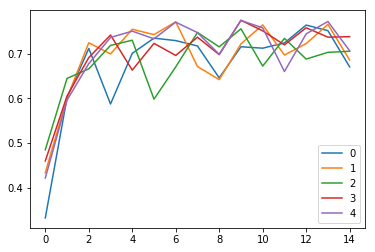

In [19]:
score_average_uncert

for i in range(score_average_uncert.shape[0]):
    plt.plot(score_average_uncert[i, 1:, 0], label = i)
# plt.plot(score_average_random[0, 1:, 0], label = "random")
plt.legend()
plt.show()

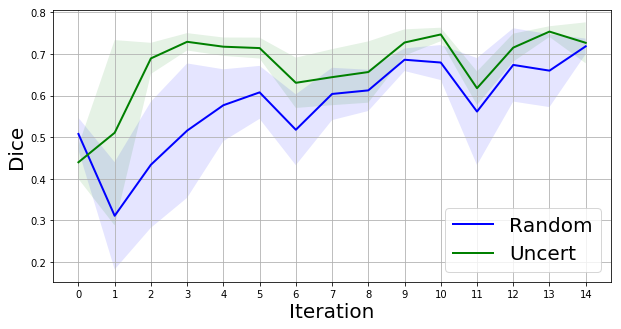

In [29]:
# Nsteps length arrays empirical means and standard deviations of both
# populations over time
mu1 = mean_rand[1:, 0]
sigma1 = std_rand[1:, 0]
# mu2 = mean_uncert[1:, 0]
# sigma2 = std_uncert[1:, 0]
mu3 = mean_uncert[1:, 0]
sigma3 = std_uncert[1:, 0]

# plot it!
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(mu1, lw=2, label='Random', color='blue')
# ax.plot(mu2, lw=2, label='Uncert', color='orange')
ax.plot(mu3, lw=2, label='Uncert', color='green')
ax.fill_between(range(15), mu1+sigma1, mu1-sigma1, facecolor='blue', alpha=0.1)
# ax.fill_between(range(15),mu2+sigma2, mu2-sigma2, facecolor='orange', alpha=0.2)
ax.fill_between(range(15),mu3+sigma3, mu3-sigma3, facecolor='green', alpha=0.1)
# ax.set_title('random walkers empirical $\mu$ and $\pm \sigma$ interval')
ax.legend(loc='lower right', fontsize = 20)
ax.set_xlabel('Iteration', fontsize = 20)
ax.set_ylabel('Dice', fontsize = 20)
ax.set_xticks(range(15))
ax.grid()

((5, 16, 5), (4, 16, 5), (9, 16, 5))
((5, 16, 5), (5, 16, 5), (10, 16, 5))
((16, 5), (16, 5))


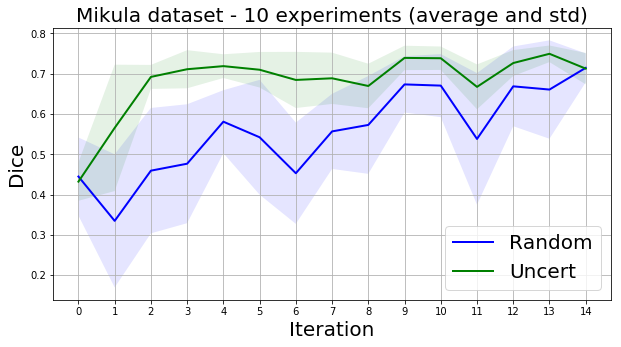

In [40]:
# concatenation
score_average_random1 = np.load("./score_average_random_"+ session_name + ".npy")
score_average_random2 = np.load("./score_average_random_"+ session_name2 + ".npy")
score_average_uncert1 = np.load("./score_average_" + session_name + ".npy")
score_average_uncert2 = np.load("./score_average_" + session_name2 + ".npy")

score_average_uncert = np.vstack((score_average_uncert1, score_average_uncert2))
score_average_random = np.vstack((score_average_random1, score_average_random2))

print(score_average_uncert1.shape, score_average_uncert2.shape, score_average_uncert.shape)
print(score_average_random1.shape, score_average_random2.shape, score_average_random.shape)


mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_rand = np.mean(score_average_random, axis = 0)

std_uncert = np.std(score_average_uncert, axis = 0)
std_rand = np.std(score_average_random, axis = 0)

print(mean_rand.shape, std_rand.shape)

# Nsteps length arrays empirical means and standard deviations of both
# populations over time
mu1 = mean_rand[1:, 0]
sigma1 = std_rand[1:, 0]

mu3 = mean_uncert[1:, 0]
sigma3 = std_uncert[1:, 0]

# plot it!
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(mu1, lw=2, label='Random', color='blue')
ax.plot(mu3, lw=2, label='Uncert', color='green')

ax.fill_between(range(15), mu1+sigma1, mu1-sigma1, facecolor='blue', alpha=0.1)
ax.fill_between(range(15),mu3+sigma3, mu3-sigma3, facecolor='green', alpha=0.1)

ax.set_title('Mikula dataset - 10 experiments (average and std)', fontsize = 20)
ax.legend(loc='lower right', fontsize = 20)
ax.set_xlabel('Iteration', fontsize = 20)
ax.set_ylabel('Dice', fontsize = 20)
ax.set_xticks(range(15))
ax.grid()

In [77]:
score_average_random = np.load("./score_average_random_"+ "experiment_7" + ".npy")
score_average_uncert = np.load("./score_average_" + session_name + ".npy")
# score_average_uncert = np.load("./results/score_average_" + 'experiment4' + ".npy")
# mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_uncert = np.mean(score_average_uncert, axis = 0)
mean_rand = np.mean(score_average_random, axis = 0)
# std_uncert = np.std(score_average_uncert, axis = 0)
std_uncert= np.std(score_average_uncert, axis = 0)
std_rand = np.std(score_average_random, axis = 0)

print(mean_rand.shape, std_rand.shape)
print(mean_uncert.shape, std_uncert.shape)
print(score_average_uncert.shape, score_average_random.shape)

((16, 5), (16, 5))
((7, 5), (7, 5))
((6, 7, 5), (6, 16, 5))


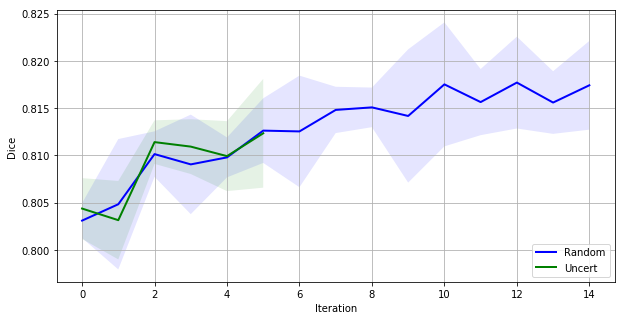

In [80]:
# Nsteps length arrays empirical means and standard deviations of both
# populations over time
mu1 = mean_rand[1:, 0]
sigma1 = std_rand[1:, 0]
# mu2 = mean_uncert[1:, 0]
# sigma2 = std_uncert[1:, 0]
mu3 = mean_uncert[1:, 0]
sigma3 = std_uncert[1:, 0]

# plot it!
fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(mu1, lw=2, label='Random', color='blue')
# ax.plot(mu2, lw=2, label='Uncert', color='orange')
ax.plot(mu3, lw=2, label='Uncert', color='green')
ax.fill_between(range(15), mu1+sigma1, mu1-sigma1, facecolor='blue', alpha=0.1)
# ax.fill_between(range(15),mu2+sigma2, mu2-sigma2, facecolor='orange', alpha=0.2)
ax.fill_between(range(6),mu3+sigma3, mu3-sigma3, facecolor='green', alpha=0.1)
# ax.set_title('random walkers empirical $\mu$ and $\pm \sigma$ interval')
ax.legend(loc='lower right')
ax.set_xlabel('Iteration')
ax.set_ylabel('Dice')
ax.grid()

In [29]:
# Index analysis

indexes = np.load("index_uncert_experiment_TEM_4.npy")
indexes_rand = np.load("index_uncert_experiment_TEM_3_random.npy")
print(indexes.shape, indexes_rand.shape)
indexes


((1, 14), (3, 14))


array([[47,  6, 36, 25, 55,  2, 45, 38, 17, 50, 71, 16, 58,  7]])

In [118]:
X_unlabelled_0.shape

(72, 1, 512, 512)

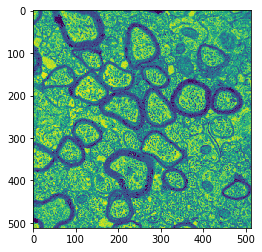

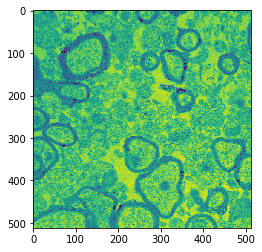

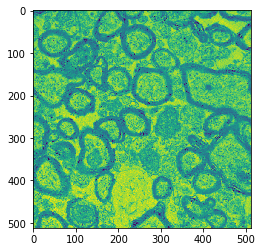

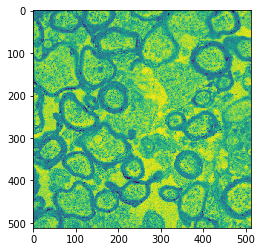

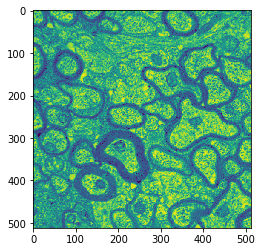

...

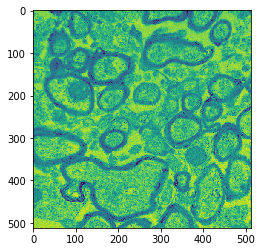

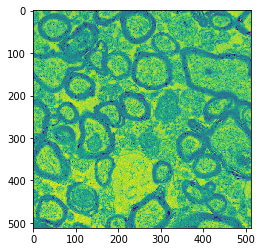

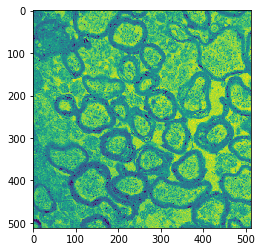

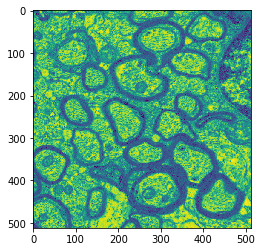

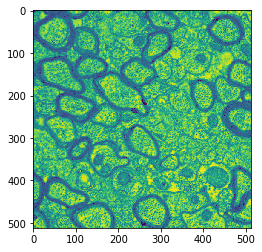

In [123]:
for i in indexes[1]:
    plt.imshow(X_unlabelled_0[i, 0, :, :])
    plt.show()


In [108]:
print(np.unique(indexes))
print(np.unique(indexes_rand))

unique_uncert = len(np.unique(indexes))
unique_rand = len(np.unique(indexes_rand))
unique = [unique_uncert, unique_rand]

[ 2  5  6 10 16 25 31 34 37 38 45 47 55 56 60 61 66 67 71]
[ 2  3  4  9 12 13 14 15 17 18 22 23 29 32 33 34 35 36 39 42 44 45 49 50
 51 52 55 59 60 62 63 64 65 67 68 69 71]


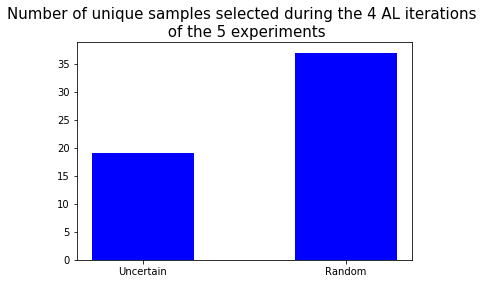

In [110]:
plt.bar(range(2), unique, width=0.5, label= "Uncertainty", color = "blue")
plt.xticks((0, 1), ["Uncertain", "Random"])
plt.title("Number of unique samples selected during the 4 AL iterations \n of the 5 experiments", fontsize = 15)
plt.show()

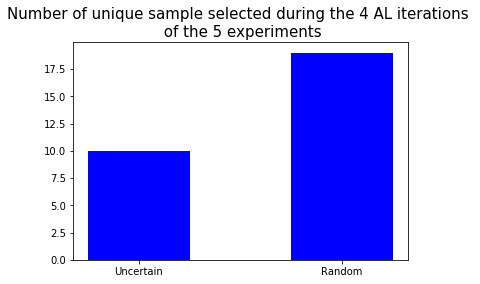

In [86]:
plt.bar(range(2), unique, width=0.5, label= "Uncertainty", color = "blue")
plt.xticks((0, 1), ["Uncertain", "Random"])
plt.title("Number of unique samples selected during the 4 AL iterations \n of the 5 experiments", fontsize = 15)
plt.show()

In [54]:
heat = np.zeros((72, 72))
for i in range(indexes.shape[1]):
    unique, counts = np.unique(indexes[:, i], return_counts=True)
    col = dict(zip(unique, counts))
    for j in range(indexes.shape[1]):
        if j in unique:
            heat[j, i] =  col[j]
        else:
            heat[j, i] = 0
    
print(heat)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [4. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [44]:
heat_rand = np.zeros((72, 72))
for i in range(indexes_rand.shape[1]):
    unique, counts = np.unique(indexes_rand[:, i], return_counts=True)
    col = dict(zip(unique, counts))
    for j in range(indexes_rand.shape[1]):
        if j in unique:
            heat_rand[j, i] =  col[j]
        else:
            heat_rand[j, i] = 0
    
print(heat_rand)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


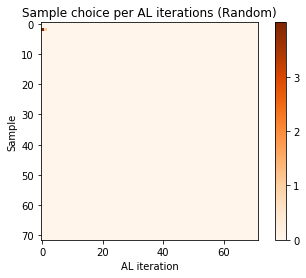

In [56]:
plt.imshow(heat, cmap='Oranges')
# plt.legend(cmap)
plt.xlabel("AL iteration")
# plt.xticks(range(8))
plt.ylabel("Sample")
plt.title("Sample choice per AL iterations (Random)")
# plt.legend(range(14), loc = 'best')
plt.colorbar(ticks=[0,  1, 2, 3])
plt.show()

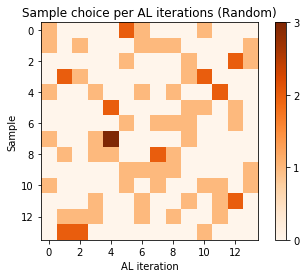

In [33]:
plt.imshow(heat_rand, cmap='Oranges')
# plt.legend(cmap)
plt.xlabel("AL iteration")
# plt.xticks(range(8))
plt.ylabel("Sample")
plt.title("Sample choice per AL iterations (Random)")
# plt.legend(range(14), loc = 'best')
plt.colorbar(ticks=[0,  1, 2, 3])
plt.show()

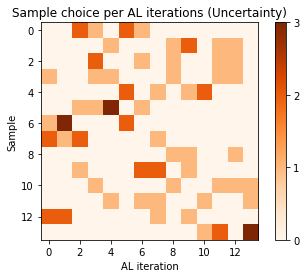

In [34]:
plt.imshow(heat, cmap='Oranges')
# plt.legend(cmap)
plt.xlabel("AL iteration")
# plt.xticks(range(8))
plt.ylabel("Sample")
plt.title("Sample choice per AL iterations (Uncertainty)")
# plt.legend(range(14), loc = 'best')
plt.colorbar(ticks=[0,  1, 2, 3])
plt.show()

{0.0: 196}
{0.0: 5182, 1.0: 1, 4.0: 1}


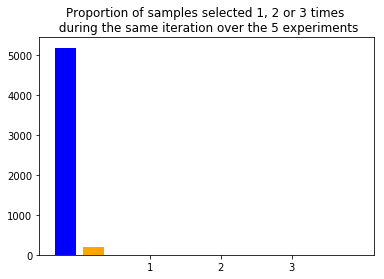

In [66]:
uni, count = np.unique(heat_rand, return_counts=True)
rand = dict(zip(uni, count))
print(rand)
uni2, count2 = np.unique(heat, return_counts=True)
unc = dict(zip(uni2, count2))
print(unc)
plt.bar(np.array(rand.keys()) + 0.2, rand.values(), width=0.3, label= "Random", color = "orange")
plt.bar(np.array(unc.keys()) - 0.2, unc.values(), width=0.3, label= "Uncertainty", color = "blue")
# plt.legend()
plt.xticks((1, 2, 3))
plt.title("Proportion of samples selected 1, 2 or 3 times \n during the same iteration over the 5 experiments")
plt.show()

In [27]:
rand.keys()

[0.0, 1.0, 2.0, 3.0]

In [17]:
def normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
        return v
    return v / norm

def plot_uncertainty(nb_active_learning_iter, uncertain_iter):
    plt.figure(figsize=(20,10))
    plt.grid(True)
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.title("Uncertainty Ranking for the 20 active learning iterations for UNCERTAINTY based selection", fontsize = 20)
    plt.xlabel("Samples", fontsize = 20)
    plt.ylabel('Normalized and Centered Uncertainty on remaining Unlabelled samples', fontsize = 20)
    color = ['black','grey', 'orange', 'red', 'pink', 'green', 'blue', 'purple', 'brown', 'darkblue', 'darkgreen', 'coral', 
            'salmon', 'aquamarine', 'lime' , 'teal', 'violet', 'orchid', 'indigo', 'tomato', 'yellow' ]
    
    for i in range(1, nb_active_learning_iter):
        A = normalize(uncertain_iter[i][uncertain_iter[i] > 0])
        plt.plot(np.flip(np.sort(A - A.mean(axis=0)), 0), color=color[i], linewidth=2.0)
        plt.legend(range(1, nb_active_learning_iter), fontsize = 20)
        #plt.xlim(0,30)
        
    plt.show()
    
def plot_iteration_analysis(nb_active_learning_iter, score_global, width, ylim_active):
    n_groups = 5
    width = width
    fig, ax = plt.subplots(figsize = (20, 10))
    index = np.arange(n_groups)

    for i in np.arange(1, nb_active_learning_iter, 1):
        plot = np.arange(-0.5, 3.8, width)
        color = "C" + str(i)
        color = np.arange(0.05, 1, 0.05)
        color = ['black','grey', 'orange', 'red', 'pink']
        rects1 = plt.bar(index + plot[i], score_global[i], width=width, color = color, label=i)


    plt.ylabel('Values',fontsize=20)
    plt.title('Pixelwise segmentation metrics for myelin, average over test set, UNCERTAINTY based',fontsize=20)
    plt.xticks(index, ('Dice', 'Jaccard', 'Accuracy', 'Precision', 'Sensitivity'),fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True)
    if ylim_active == True:
        plt.ylim(0.5, 1)

    plt.tight_layout()
    plt.show()
    
def plot_iteration_difference(nb_active_learning_iter, score_global, width):
    score_relative = np.delete(score_global, 0, 0)
    diff = np.zeros((nb_active_learning_iter, 5))
    for j in range(0, 5):
        for i in range(0, nb_active_learning_iter-1):
            diff[i, j] = score_relative[i+1, j] - score_relative[i, j]
    
    n_groups = 5

    fig, ax = plt.subplots(figsize = (20, 10))
    index = np.arange(n_groups)

    for i in np.arange(0, nb_active_learning_iter, 1):
        plot = np.arange(-0.5, 4.8, width)
        rects1 = plt.bar(index + plot[i], diff[i, :], width=width, color='grey', label=i)

    plt.ylabel('Difference',fontsize=20)
    plt.title('Metrics differences between 2 iterations for UNCERTAINTY Based selection',fontsize=20)
    plt.xticks(index, ('Dice', 'Jaccard', 'Accuracy', 'Precision', 'Sensitivity'),fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    


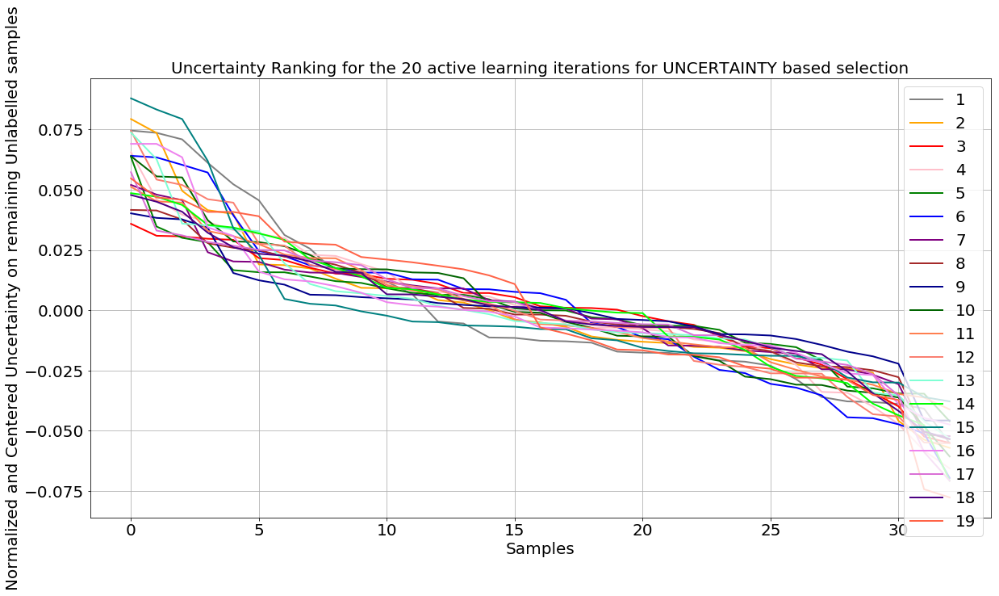

In [123]:
plot_uncertainty(nb_active_learning_iter, uncertain_iter)

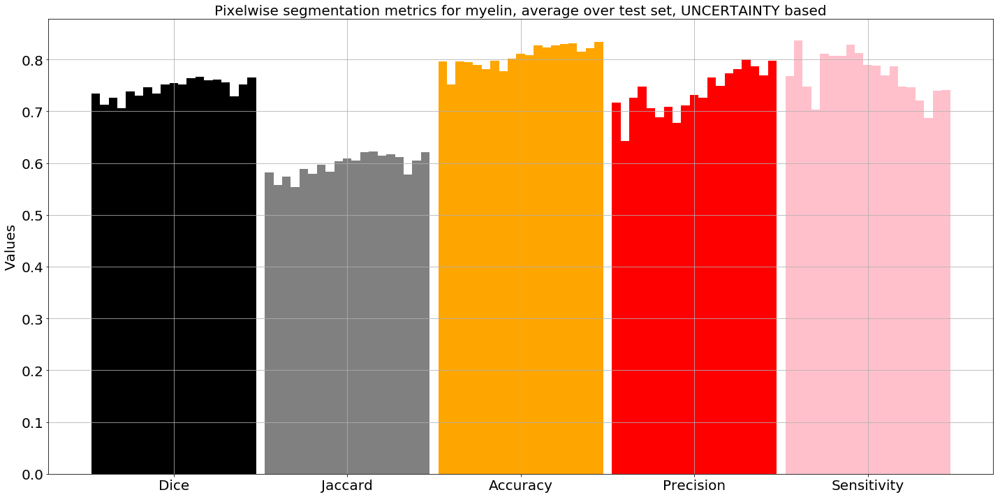

In [124]:
plot_iteration_analysis(nb_active_learning_iter, score_global, width = 0.05 , ylim_active =False )

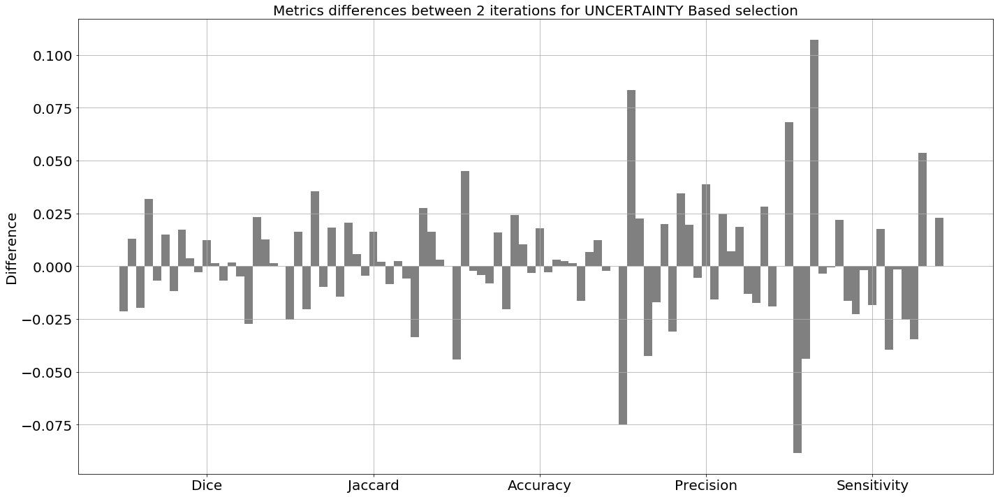

In [125]:
plot_iteration_difference(nb_active_learning_iter, score_global, width = 0.05)

# Other

In [81]:
def read_history(history_path):
    txt_file = open(history_path,'r')
    text = txt_file.read()[2:-1].split(", '")

    loss = np.fromstring(text[0].split("[")[1][:-1], sep=',')
    val_dice_coef = np.fromstring(text[1].split("[")[1][:-1], sep=',')
    val_loss = np.fromstring(text[2].split("[")[1][:-1], sep=',')
    dice_coef = np.fromstring(text[3].split("[")[1][:-1], sep=',')
    return loss, val_dice_coef, val_loss, dice_coef


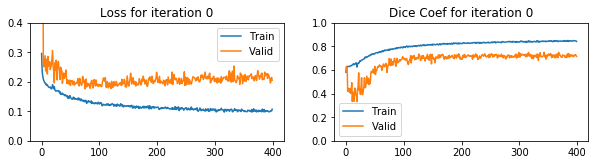

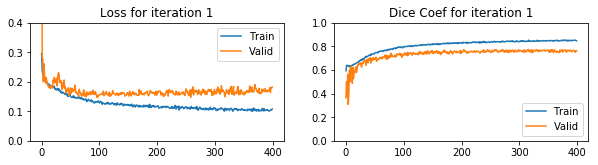

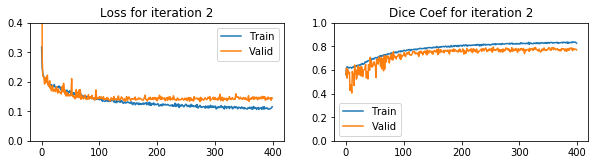

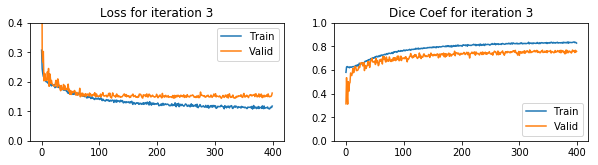

In [83]:
for i  in range(4):
    history_path = ['/home/malub_local/history/1004_0723_52_history_iter_0_.txt', 
                    "/home/malub_local/history/1004_0723_52_history_iter_1_.txt", 
                    "/home/malub_local/history/1004_0723_52_history_iter_2_.txt",
                   "/home/malub_local/history/1004_0723_52_history_iter_3_.txt"] 
    loss, val_dice_coef, val_loss, dice_coef = read_history(history_path[i])
    fig, ax = plt.subplots(figsize = (10, 10))
    plt.subplot(420 + 2*i + 1)
    plt.plot(loss)
    plt.plot(val_loss)
    plt.title("Loss for iteration " + str(i))
    plt.legend(["Train", "Valid"])
    plt.ylim(0, 0.4)
    plt.subplot(420 + 2*i + 2)
    plt.plot(dice_coef)
    plt.plot(val_dice_coef)
    plt.title("Dice Coef for iteration " + str(i))
    plt.legend(["Train", "Valid"])
    plt.ylim(0, 1)
    plt.show()

## Display segmentation for X_test 

In [25]:
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model, X_test)

Computing predictions for unlabelled data ...



In [26]:
print(uncertain_test)
np.argsort(uncertain_test)

[ 436.3938638   369.96846916  398.04315226 1120.83765304  847.77567812
 1076.47512274 1015.45854614  403.4920765   253.60533468  378.02101098
 1014.95404825  923.83218173  902.8203108  1000.61951993  526.04766765
  417.32853918  258.29971342  453.47798527  440.06567233  542.49985674]


array([ 8, 16,  1,  9,  2,  7, 15,  0, 18, 17, 14, 19,  4, 12, 11, 13, 10,
        6,  5,  3])

In [27]:
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model, X_test)
predictions_test = np.asarray(predictions_test)

Computing predictions for unlabelled data ...



Computing predictions for unlabelled data ...



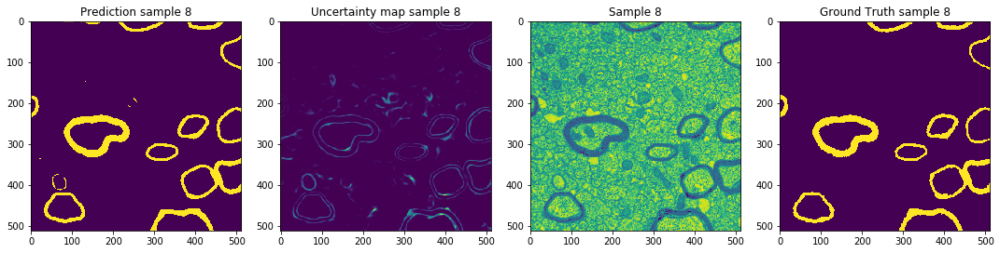

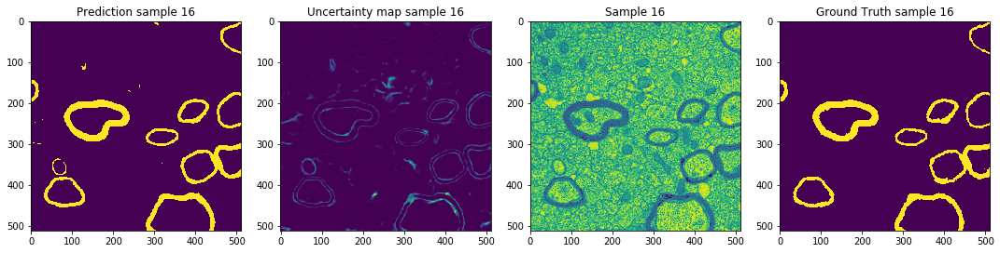

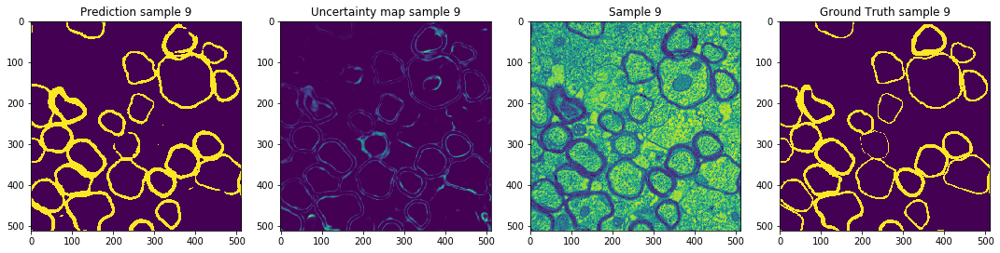

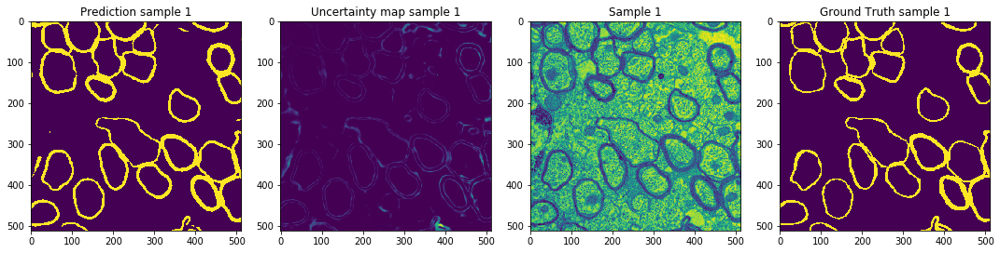

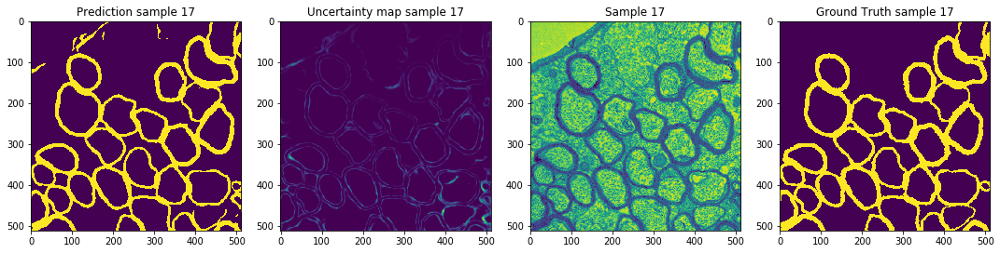

...

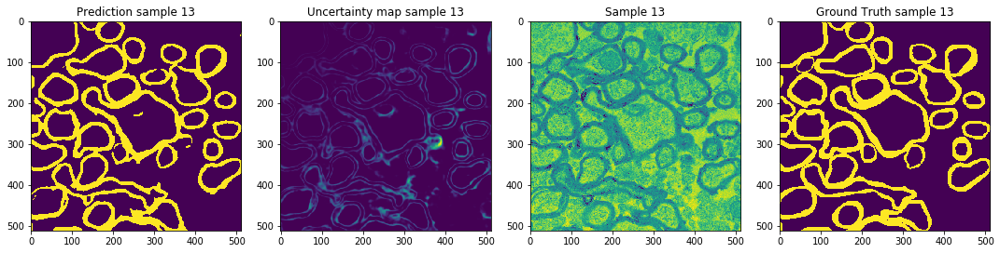

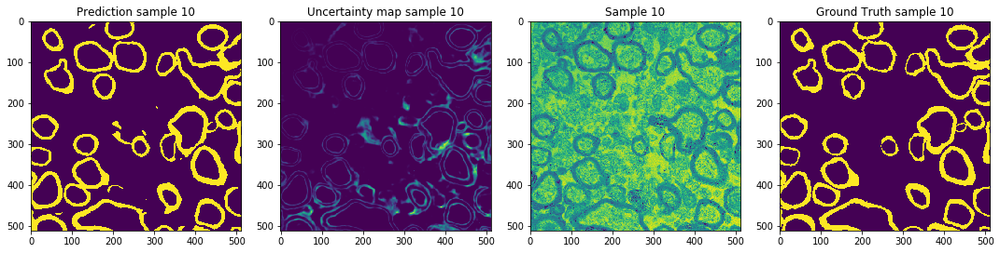

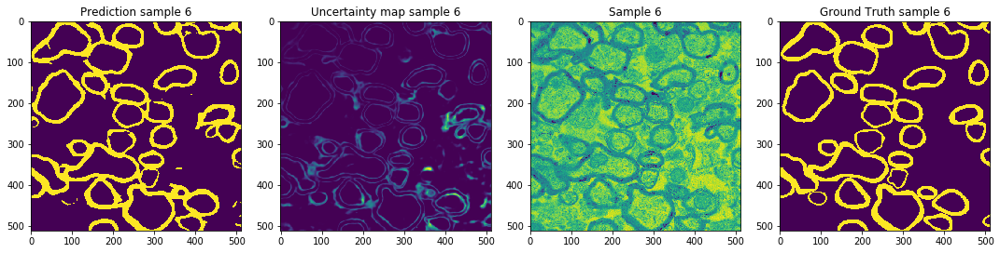

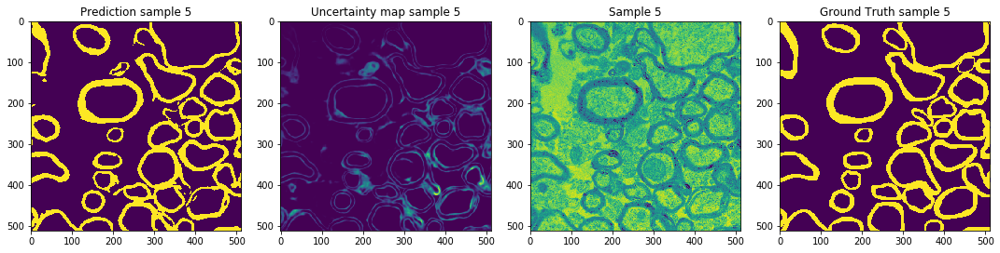

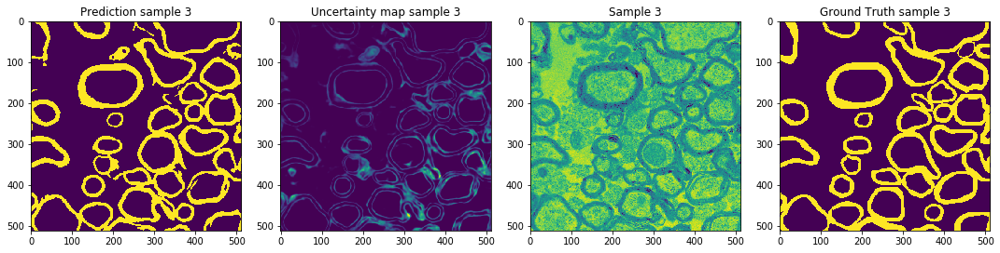

In [28]:
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model, X_test)
predictions_test = np.asarray(predictions_test)
# Plot predictions and uncertainty map for 2 samples 
# rand_int = random.randint(0, len(X_test)-1)
for indice in np.argsort(uncertain_test):
    plt.figure(figsize=(15,15))
    plt.subplot(141)
    plt.imshow(predictions_test[indice][:,:])
    plt.title("Prediction sample " + str(indice))
    plt.subplot(142)
    plt.imshow(np.asarray(uncertain_map_test)[indice, 0])
    plt.title("Uncertainty map sample "+ str(indice))
    plt.subplot(143)
    plt.imshow(X_test[indice][0,:,:])
    plt.title("Sample "+ str(indice))
    plt.subplot(144)
    plt.imshow(y_test[indice][0,:,:])
    plt.title("Ground Truth sample "+ str(indice))
    plt.tight_layout()
    plt.show()

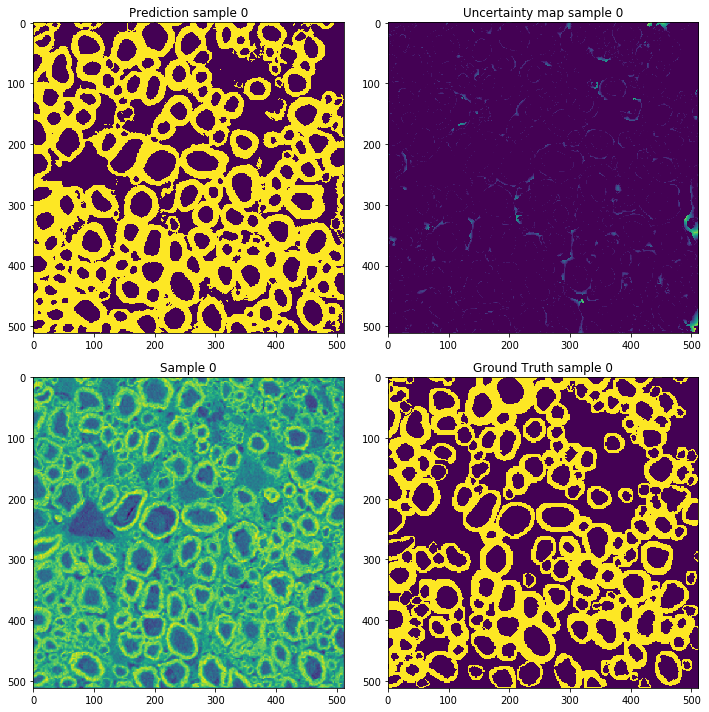

In [84]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = 10

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(X_unlabelled_0[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()

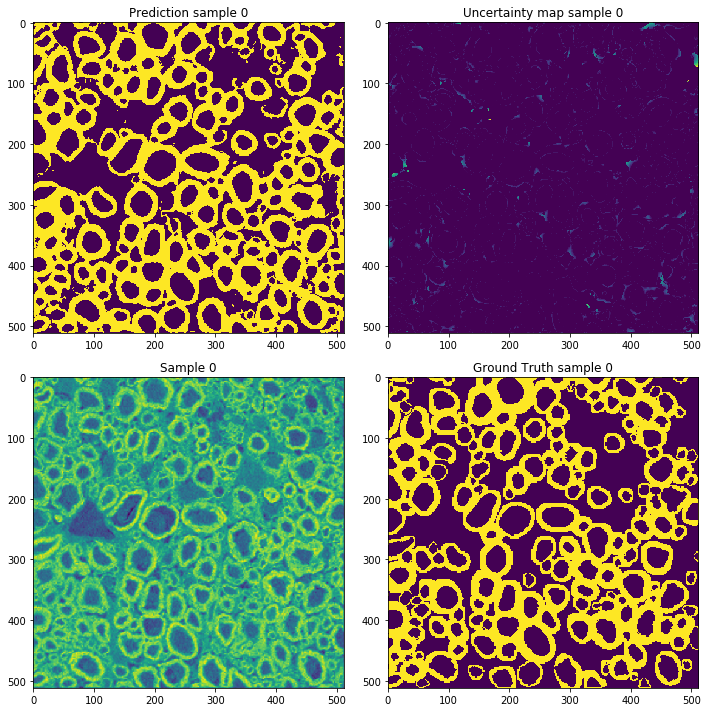

In [55]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()

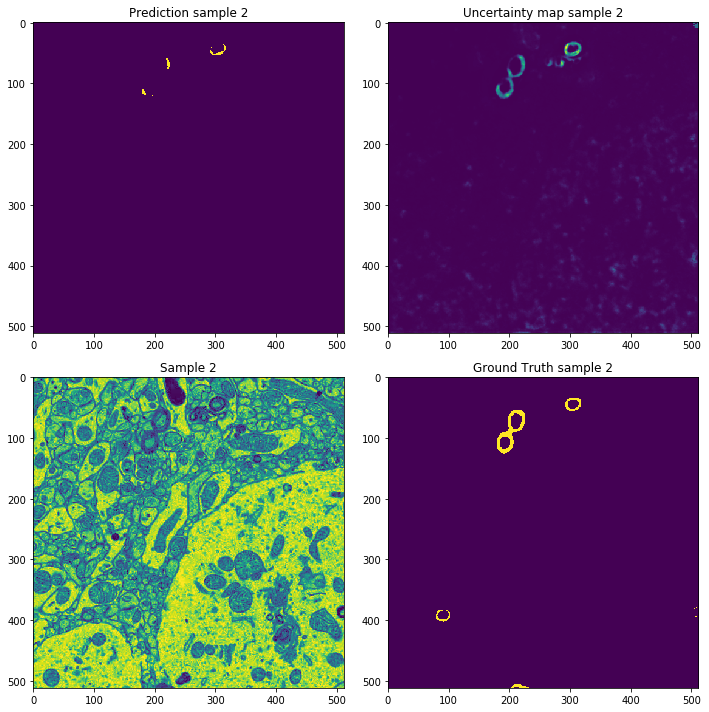

In [360]:
# Plot predictions and uncertainty map for 2 samples 
rand_int = random.randint(0, len(X_test)-1)

plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[rand_int][:,:])
plt.title("Prediction sample " + str(rand_int))
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[rand_int, 0])
plt.title("Uncertainty map sample "+ str(rand_int))
plt.subplot(223)
plt.imshow(X_test[rand_int][0,:,:])
plt.title("Sample "+ str(rand_int))
plt.subplot(224)
plt.imshow(y_test[rand_int][0,:,:])
plt.title("Ground Truth sample "+ str(rand_int))
plt.tight_layout()
plt.show()


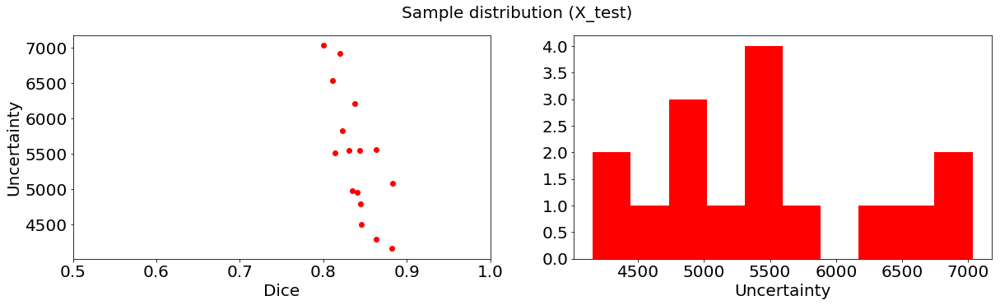

In [133]:
dice_plot = np.zeros(len(X_test))


for i in range(len(X_test)):
    dice_plot[i] = compute_dice_coef(y_test[i][0,:,:], predictions_test[i][:,:])
    

plt.figure(figsize=(20,5))
plt.subplot(121)
plt.scatter(dice_plot, uncertain_test, color = "red")
plt.xlabel("Dice", fontsize=20)
plt.ylabel("Uncertainty", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlim(0.5, 1)

plt.subplot(122)
plt.hist(uncertain_test.flatten(), 10, color = "red")
plt.xlabel("Uncertainty", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.suptitle("Sample distribution (X_test)", fontsize=20)
plt.show()

In [54]:
acc

array([0.87511444, 0.86398315, 0.88320541, 0.91376877, 0.88190079,
       0.85490799, 0.84724045, 0.91880035, 0.8605423 , 0.95693207,
       0.88864899, 0.89064789, 0.90397644, 0.84415817, 0.88794708,
       0.87411118])

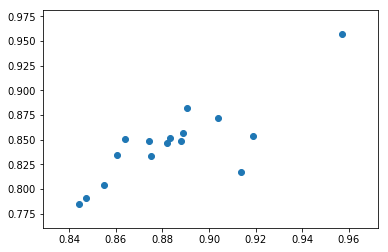

In [55]:
plt.scatter(acc, dice)

## Choose threshold 

In [84]:
# uncertainty computation
dice_coef_test = np.zeros(len(X_test))
dice = []

print("Computing log predictions ...\n")
predictions = predict(X_test, model)

for threshold in np.arange(0, 1, 0.05):
    dice_coef_test = np.zeros(len(X_test))
    for i in range(len(X_test)):
        sample = X_test[i].reshape([1, 1, img_rows, img_cols])
        sample_prediction = cv2.threshold(predictions[i], threshold, 1, cv2.THRESH_BINARY)[1].astype('uint8')
        dice_coef_test[i] = compute_dice_coef(y_test[i][0], sample_prediction)
    dice.append(np.mean(dice_coef_test))


print(len(dice))
print("Done")


Computing log predictions ...

20
Done


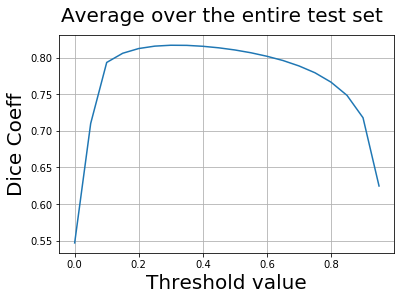

In [85]:
plt.plot(np.arange(0, 1, 0.05), dice )
plt.suptitle("Average over the entire test set", fontsize = 20)
plt.ylabel("Dice Coeff", fontsize = 20)
plt.xlabel("Threshold value", fontsize = 20)
plt.grid()
#plt.ylim(0.7, 0.75)
plt.show()

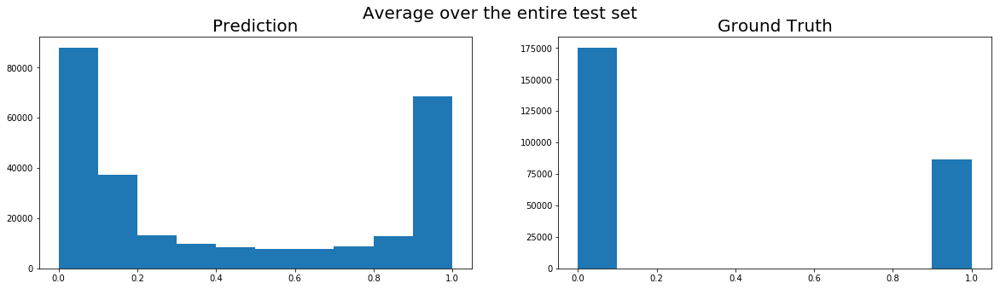

In [33]:
plt.figure(figsize=(20,5))
plt.suptitle("Average over the entire test set", fontsize = 20)
plt.subplot(121)
plt.hist(predictions[0].flatten())
plt.title("Prediction", fontsize = 20)
plt.subplot(122)
plt.hist(y_test[0].flatten())
plt.title("Ground Truth", fontsize = 20)
plt.show()

# Visuaize Data Augmentation

In [ ]:
def take(n, iterable):
    "Return first n items of the iterable as a list"
    return list(islice(iterable, n))

def visualize_data_augmentation(generator):
    batch1 = take(1, generator)
    max_images = 16
    grid_width = 8
    grid_height = 1
    fig, axs = plt.subplots(grid_height, grid_width, figsize=(20, 20))
    for i in range(8):
        img = batch1[0][0][i, 0, :, :]
        mask = batch1[0][1][i, 0, :, :]
        ax = axs[ i % grid_width]
        ax.imshow(img, cmap="gray")
        ax.set_yticklabels([])
        ax.set_xticklabels([])


    fig, axs = plt.subplots(grid_height, grid_width, figsize=(20, 10))
    for i in range(8):
        img = batch1[0][0][i, 0, :, :]
        mask = batch1[0][1][i, 0, :, :]
        ax = axs[ i % grid_width]
        ax.imshow(mask, cmap="gray")
        ax.set_yticklabels([])
        ax.set_xticklabels([])

In [ ]:
visualize_data_augmentation(train_generator)

# Datasets 

In [23]:
# path_img = "/home/malub_local/data/mikula/mikula_image.npy"
# path_mask = "/home/malub_local/data/mikula/mikula_mask.npy"

# init_labelled_size = 5
# test_size = 10
# validation_size = 10

# load data
X_full, y_full = load_data(path_img, path_mask, 512, 512 )
#index_labelled, index_unlabelled, index_test = random_index_generator(X_full, 20, 16)
index_labelled, index_unlabelled, index_test, index_validation = data_splitting(X_full, init_labelled_size,
                                                                                test_size, validation_size)
# split data into train (labelled, 30%), unlabelled (active learning simulation, 50%), test (20%)
X_labelled_0, y_labelled_0, X_unlabelled_0, y_unlabelled_0, X_test, y_test , X_validation, y_validation = split_for_simulation(X_full, y_full,
                                                                                                  index_labelled,
                                                                                                  index_unlabelled,
                                                                                                  index_test, index_validation)


print(X_labelled_0.shape, y_labelled_0.shape, X_unlabelled_0.shape, y_unlabelled_0.shape, X_test.shape, 
     y_test.shape, X_validation.shape, y_validation.shape)


Loading data...

((5, 512, 512), (5, 512, 512), (71, 512, 512), (71, 512, 512), (10, 512, 512), (10, 512, 512), (10, 512, 512), (10, 512, 512))


(5, 1, 256, 256)


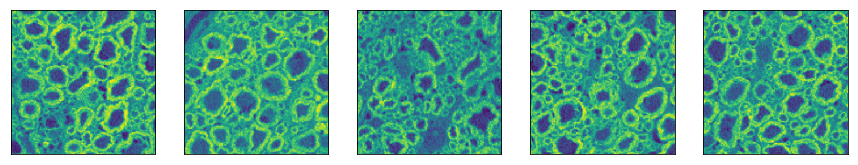

(5, 1, 256, 256)


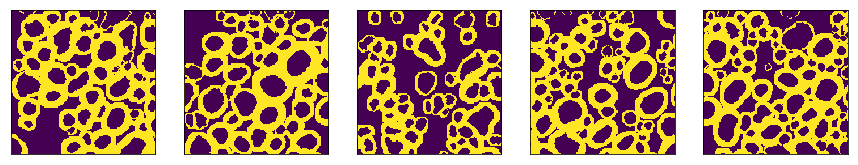

In [76]:
print(X_labelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows+1):
    img = X_labelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()
print(y_labelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 1
for i in range(1, columns*rows+1):
    img = y_labelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(10, 1, 256, 256)


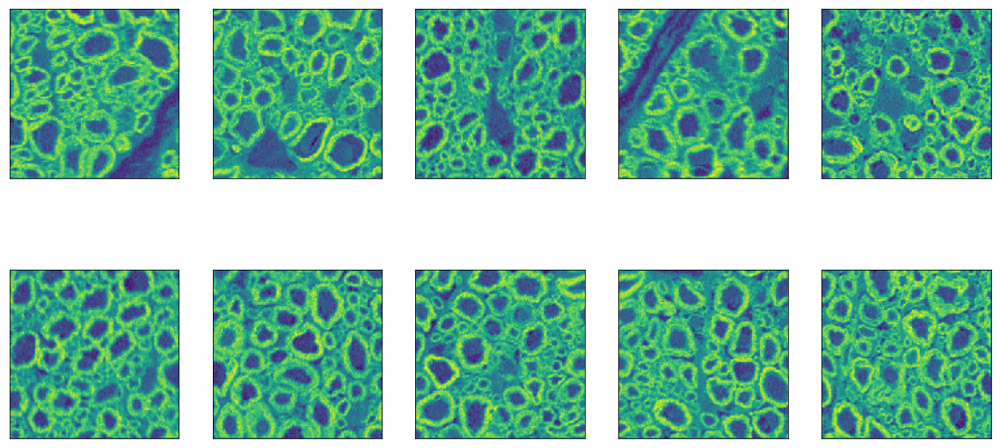

(10, 1, 256, 256)


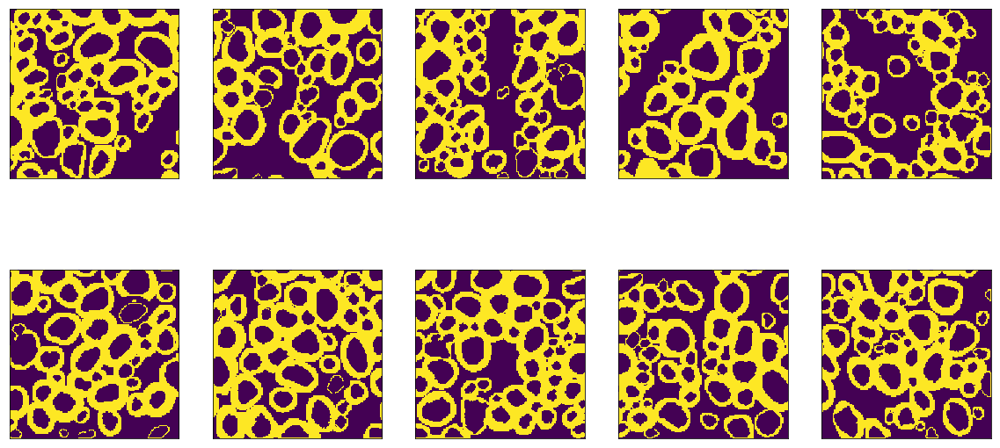

In [77]:
print(X_validation.shape)
fig=plt.figure(figsize=(20, 10))
columns = 5
rows = 2
for i in range(1, columns*rows+1):
    img = X_validation[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

print(y_validation.shape)
fig=plt.figure(figsize=(20, 10))
columns = 5
rows = 2
for i in range(1, columns*rows+1):
    img = y_validation[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
plt.show()

(15, 1, 256, 256)


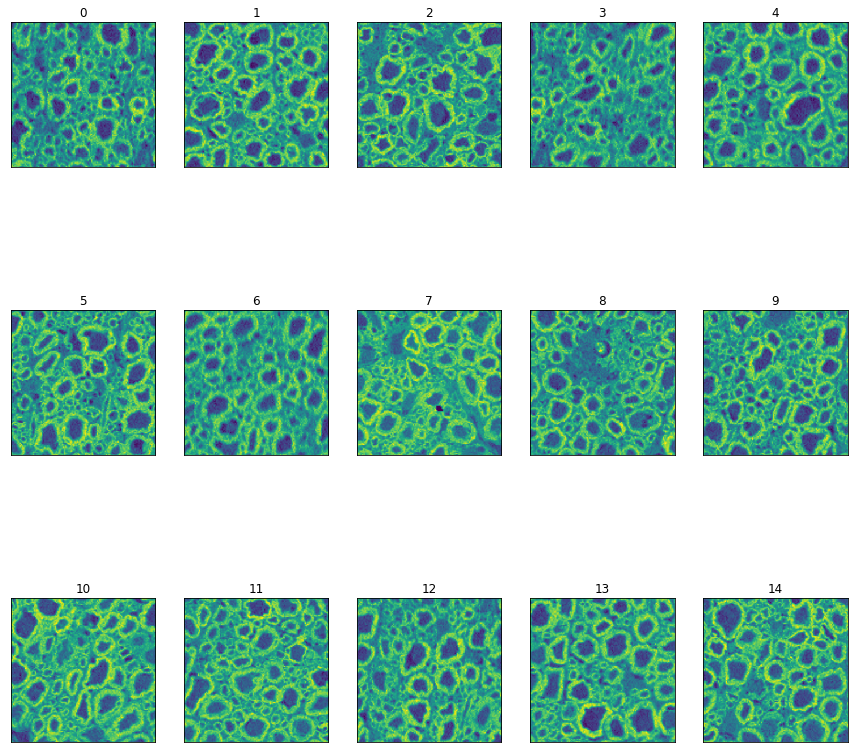

In [86]:
print(X_unlabelled_0.shape)
fig=plt.figure(figsize=(15, 15))
columns = 5
rows = 3
for i in range(1, columns*rows+1):
    img = X_unlabelled_0[i-1, 0]
    fig.add_subplot(rows, columns, i)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title(i-1)
plt.show()

In [44]:
model_maps = unet_full_bn(dropout = True)
model_maps.load_weights('../models/AL_model_random_14.hdf5')



In [45]:
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model_maps, X_test)
predictions_test = np.asarray(predictions_test)
np.argsort(uncertain_test)

Computing predictions for unlabelled data ...



array([16,  8, 18,  1, 17,  7,  9,  2,  0, 15, 14, 11, 19, 13,  4,  6,  5,
        3, 12, 10])

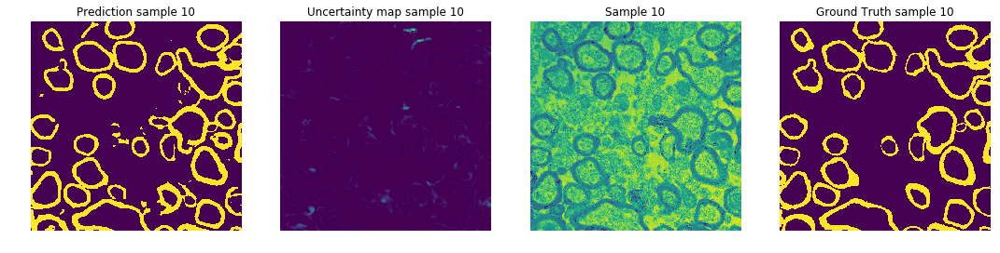

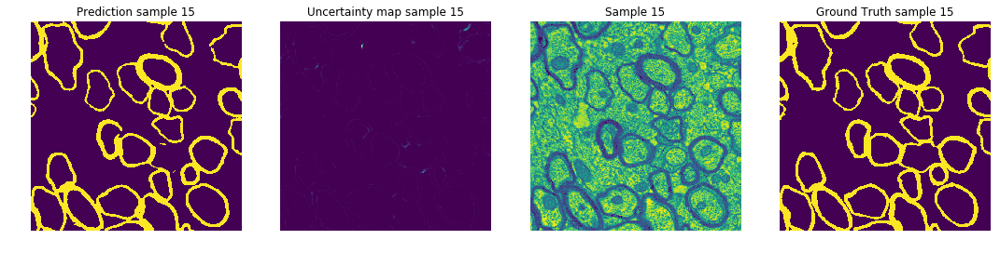

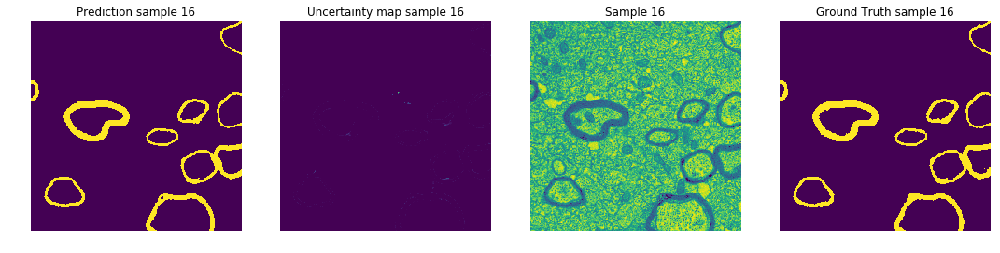

In [48]:

# Plot predictions and uncertainty map for 2 samples 
# rand_int = random.randint(0, len(X_test)-1)
for indice in [10, 15, 16]:
    plt.figure(figsize=(15,15))
    plt.subplot(141)
    plt.axis('off')
    plt.imshow(predictions_test[indice][:,:])
    plt.title("Prediction sample " + str(indice))
    plt.subplot(142)
    plt.axis('off')
    plt.imshow(np.asarray(uncertain_map_test)[indice, 0])
    plt.title("Uncertainty map sample "+ str(indice))
    plt.subplot(143)
    plt.axis('off')
    plt.imshow(X_test[indice][0,:,:])
    plt.title("Sample "+ str(indice))
    plt.subplot(144)
    plt.axis('off')
    plt.imshow(y_test[indice][0,:,:])
    plt.title("Ground Truth sample "+ str(indice))
    plt.tight_layout()
    plt.show()

Computing predictions for unlabelled data ...



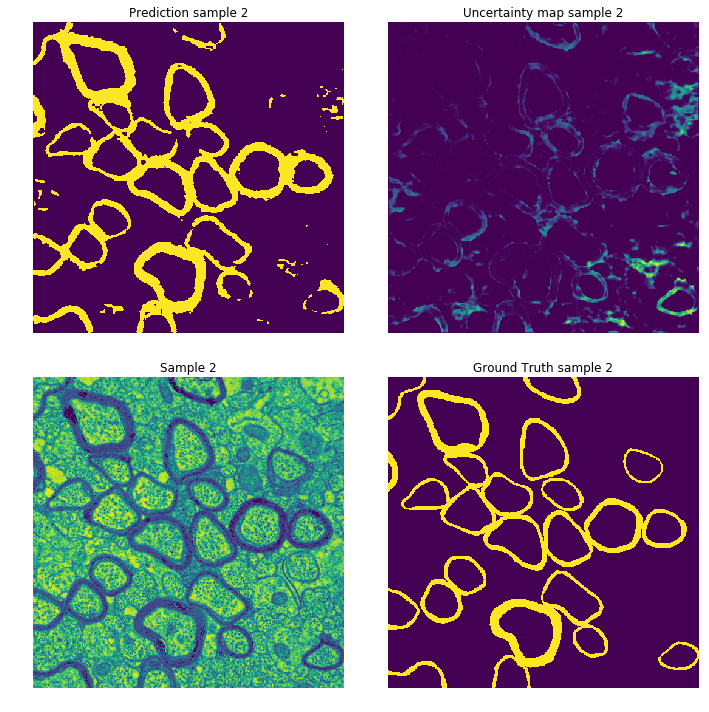

In [30]:
model_maps = unet_full_bn(dropout = True)
model_maps.load_weights('../models/AL_model_test_0.hdf5')
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model_maps, X_test)
predictions_test = np.asarray(predictions_test)
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[2][:,:])
plt.title("Prediction sample " + str(2))
plt.axis('off')
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[2, 0])
plt.title("Uncertainty map sample "+ str(2))
plt.axis('off')
plt.subplot(223)
plt.imshow(X_test[2][0,:,:])
plt.title("Sample "+ str(2))
plt.axis('off')
plt.subplot(224)
plt.imshow(y_test[2][0,:,:])
plt.title("Ground Truth sample "+ str(2))
plt.axis('off')
plt.tight_layout()
plt.show()

Computing predictions for unlabelled data ...



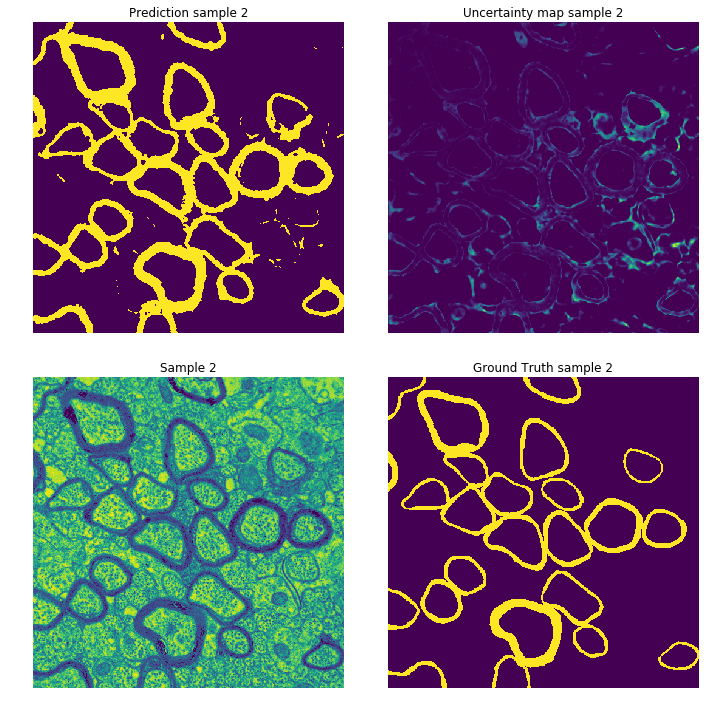

In [33]:
model_maps = unet_full_bn(dropout = True)
model_maps.load_weights('../models/AL_model_test_1.hdf5')
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model_maps, X_test)
predictions_test = np.asarray(predictions_test)
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[2][:,:])
plt.title("Prediction sample " + str(2))
plt.axis('off')
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[2, 0])
plt.title("Uncertainty map sample "+ str(2))
plt.axis('off')
plt.subplot(223)
plt.imshow(X_test[2][0,:,:])
plt.title("Sample "+ str(2))
plt.axis('off')
plt.subplot(224)
plt.imshow(y_test[2][0,:,:])
plt.title("Ground Truth sample "+ str(2))
plt.axis('off')
plt.tight_layout()
plt.show()

Computing predictions for unlabelled data ...



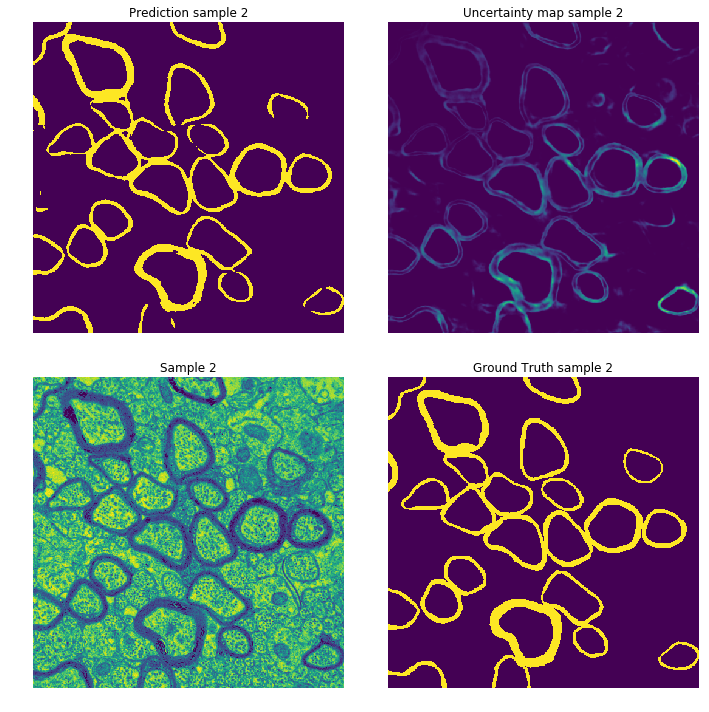

In [34]:
model_maps = unet_full_bn(dropout = True)
model_maps.load_weights('../models/AL_model_test_10.hdf5')
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model_maps, X_test)
predictions_test = np.asarray(predictions_test)
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[2][:,:])
plt.title("Prediction sample " + str(2))
plt.axis('off')
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[2, 0])
plt.title("Uncertainty map sample "+ str(2))
plt.axis('off')
plt.subplot(223)
plt.imshow(X_test[2][0,:,:])
plt.title("Sample "+ str(2))
plt.axis('off')
plt.subplot(224)
plt.imshow(y_test[2][0,:,:])
plt.title("Ground Truth sample "+ str(2))
plt.axis('off')
plt.tight_layout()
plt.show()

Computing predictions for unlabelled data ...



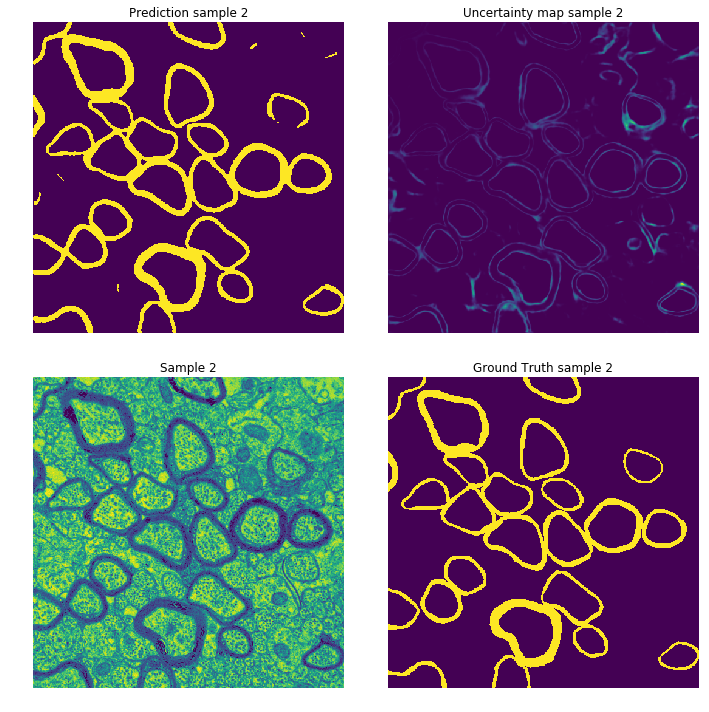

In [35]:
model_maps = unet_full_bn(dropout = True)
model_maps.load_weights('../models/AL_model_test_14.hdf5')
uncertain_test, uncertain_map_test, predictions_test = uncertainty_for_ranking(model_maps, X_test)
predictions_test = np.asarray(predictions_test)
plt.figure(figsize=(10,10))
plt.subplot(221)
plt.imshow(predictions_test[2][:,:])
plt.title("Prediction sample " + str(2))
plt.axis('off')
plt.subplot(222)
plt.imshow(np.asarray(uncertain_map_test)[2, 0])
plt.title("Uncertainty map sample "+ str(2))
plt.axis('off')
plt.subplot(223)
plt.imshow(X_test[2][0,:,:])
plt.title("Sample "+ str(2))
plt.axis('off')
plt.subplot(224)
plt.imshow(y_test[2][0,:,:])
plt.title("Ground Truth sample "+ str(2))
plt.axis('off')
plt.tight_layout()
plt.show()

In [36]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           (None, 1, 512, 512)  0                                            
__________________________________________________________________________________________________
conv2d_286 (Conv2D)             (None, 32, 512, 512) 320         input_16[0][0]                   
__________________________________________________________________________________________________
conv2d_287 (Conv2D)             (None, 32, 512, 512) 9248        conv2d_286[0][0]                 
__________________________________________________________________________________________________
batch_normalization_121 (BatchN (None, 32, 512, 512) 128         conv2d_287[0][0]                 
__________________________________________________________________________________________________
max_poolin